In [ ]:
import warnings
warnings.filterwarnings("ignore")
!pip install table-evaluator
!pip install ctgan

In [ ]:
# !python --version
# !pip --version
# !pip3 --version

In [ ]:
from ctgan import load_demo
# US Census Income dataset
real_data = load_demo()

discrete_columns = [
    'workclass',
    'education',
    'marital-status',
    'occupation',
    'relationship',
    'race',
    'sex',
    'native-country',
    'income'
]

In [ ]:
real_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [ ]:
print(real_data.head(500))

     age          workclass  fnlwgt      education  education-num  \
0     39          State-gov   77516      Bachelors             13   
1     50   Self-emp-not-inc   83311      Bachelors             13   
2     38            Private  215646        HS-grad              9   
3     53            Private  234721           11th              7   
4     28            Private  338409      Bachelors             13   
..   ...                ...     ...            ...            ...   
495   41            Private  343121        HS-grad              9   
496   20            Private  262749   Some-college             10   
497   23            Private  403107        5th-6th              3   
498   26            Private   64293   Some-college             10   
499   72                  ?  303588        HS-grad              9   

          marital-status          occupation    relationship    race      sex  \
0          Never-married        Adm-clerical   Not-in-family   White     Male   
1     Mar

In [ ]:
print(real_data.shape)
print(real_data.columns)

(32561, 15)
Index(['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')


In [ ]:
real_data.describe() # percentiles=[.1, .5, .9]

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [ ]:
real_data.describe(include=['O']) # ,exclude=['O'], include=['category']

,workclass,education,marital-status,occupation,relationship,race,sex,native-country,income
count,32561,32561,32561,32561,32561,32561,32561,32561,32561
unique,9,16,7,15,6,5,2,42,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,27816,21790,29170,24720


In [ ]:
real_data.describe(include='all')

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
count,32561.000000,32561,3.256100e+04,32561,32561.000000,32561,32561,32561,32561,32561,32561.000000,32561.000000,32561.000000,32561,32561
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,2
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,22696,NaN,10501,NaN,14976,4140,13193,27816,21790,NaN,NaN,NaN,29170,24720
mean,38.581647,NaN,1.897784e+05,NaN,10.080679,NaN,NaN,NaN,NaN,NaN,1077.648844,87.303830,40.437456,NaN,NaN
std,13.640433,NaN,1.055500e+05,NaN,2.572720,NaN,NaN,NaN,NaN,NaN,7385.292085,402.960219,12.347429,NaN,NaN
min,17.000000,NaN,1.228500e+04,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,1.178270e+05,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,1.783560e+05,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,2.370510e+05,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [ ]:
# print(real_data['workclass'].describe(include=['O']))
# print(real_data['workclass'].unique())
# print(real_data['workclass'].value_counts())

# print(real_data['occupation'].describe(include=['O']))
# print(real_data['occupation'].unique())
# print(real_data['occupation'].value_counts())

# print(real_data.groupby(unknown_cols).mean())
# print(real_data.groupby(unknown_cols).max())
# print(real_data.groupby(unknown_cols).min())
# print(real_data.pivot_table(values="income", index=unknown_cols))

print(real_data['income'].unique())
print(real_data['income'].describe()) # .describe(include='O')
print(real_data['income'].value_counts())

print(real_data['occupation'].unique())
print(real_data['occupation'].describe()) # .describe(include='O')
print(real_data['occupation'].value_counts())

In [ ]:
print(real_data.isnull().sum())

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
income            0
dtype: int64

In [ ]:
# unknown_cols = []
# for col in discrete_columns:
#     print('\n***', col)
#     print(True if "?" in "".join(real_data[col].unique()) else False) # print(real_data[col].unique()) ## ordered .value_counts().index
#     if "?" in "".join(real_data[col].unique()):
#         unknown_cols.append(col)
#     print(real_data[col].describe(include=['O']))
#     print(real_data[col].value_counts())


*** workclass
True
count        32561
unique           9
top        Private
freq         22696
Name: workclass, dtype: object
 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1298
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: workclass, dtype: int64

*** education
False
count        32561
unique          16
top        HS-grad
freq         10501
Name: education, dtype: object
 HS-grad         10501
 Some-college     7291
 Bachelors        5355
 Masters          1723
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           646
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           333
 1st-4th           168
 Preschool          51
Name: education, dtype: int64

*** marital-status
False
count                   32561
unique            

In [ ]:
# obtain locations for entries containing unknown "?" values
unknown_loc = []
for col in discrete_columns:
    unknown_loc.extend(real_data[real_data[col] == " ?"].index.tolist()) # unknown_loc.append(real_data[real_data[col] == " ?"].index.values)
unknown_loc = sorted(set(unknown_loc))
known_loc = [x for x in range(0, len(real_data))
                              if x not in set(unknown_loc)]
print(unknown_loc)
print(known_loc)

# # obtain locations for entries containing unknown "?" values
# unknown_loc = []
# for col in unknown_cols:
#     unknown_loc.extend(real_data[real_data[col] == " ?"].index.tolist()) # unknown_loc.append(real_data[real_data[col] == " ?"].index.values)
# unknown_loc = sorted(set(unknown_loc))
# known_loc = [x for x in range(0, len(real_data))
#                               if x not in set(unknown_loc)]
# print(unknown_loc)
# print(known_loc)

In [ ]:
# extract all the entries containing unknown "?" values # real_data[real_data.isna()].dropna() #.fillna("?")
unknown_entries = real_data.loc[unknown_loc].copy().reset_index(drop=True)
print(unknown_entries)

# extract all the entries without any unknown "?" values
known_entries = real_data.loc[known_loc].copy().reset_index(drop=True)
print(known_entries)

# store to real_dataset dict # real_dataset['known_entries']
real_dataset = {'known_entries': known_entries, 'unknown_entries': unknown_entries}

      age workclass  fnlwgt      education  education-num  \
0      40   Private  121772      Assoc-voc             11   
1      54         ?  180211   Some-college             10   
2      31   Private   84154   Some-college             10   
3      18   Private  226956        HS-grad              9   
4      32         ?  293936        7th-8th              4   
...   ...       ...     ...            ...            ...   
2394   35         ?  320084      Bachelors             13   
2395   30         ?   33811      Bachelors             13   
2396   71         ?  287372      Doctorate             16   
2397   41         ?  202822        HS-grad              9   
2398   72         ?  129912        HS-grad              9   

              marital-status      occupation    relationship  \
0         Married-civ-spouse    Craft-repair         Husband   
1         Married-civ-spouse               ?         Husband   
2         Married-civ-spouse           Sales         Husband   
3          

In [ ]:
# print(real_data.groupby(unknown_cols).mean())
# print(real_data.groupby(unknown_cols).max())
# print(real_data.groupby(unknown_cols).min())
# print(real_data.pivot_table(values="income", index=unknown_cols))

print(unknown_entries['income'].unique())
print(unknown_entries['income'].describe()) # .describe(include='O')
print(unknown_entries['income'].value_counts())

print(unknown_entries['occupation'].unique())
print(unknown_entries['occupation'].describe()) # .describe(include='O')
print(unknown_entries['occupation'].value_counts())

[' >50K' ' <=50K']
count       2399
unique         2
top        <=50K
freq        2066
Name: income, dtype: object
 <=50K    2066
 >50K      333
Name: income, dtype: int64
[' Craft-repair' ' ?' ' Sales' ' Other-service' ' Adm-clerical'
 ' Exec-managerial' ' Prof-specialty' ' Machine-op-inspct'
 ' Transport-moving' ' Handlers-cleaners' ' Priv-house-serv'
 ' Farming-fishing' ' Tech-support' ' Protective-serv']
count     2399
unique      14
top          ?
freq      1843
Name: occupation, dtype: object
 ?                    1843
 Prof-specialty        102
 Other-service          83
 Exec-managerial        74
 Craft-repair           69
 Sales                  66
 Adm-clerical           49
 Machine-op-inspct      36
 Transport-moving       25
 Handlers-cleaners      20
 Tech-support           16
 Priv-house-serv         6
 Farming-fishing         5
 Protective-serv         5
Name: occupation, dtype: int64


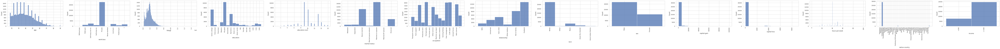

In [ ]:
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='whitegrid',color_codes=True)
# plot for all the entries containing unknown "?" values
plt.figure(figsize=(150,4))
entries = real_data

count = 0
for i in entries.columns:
    count += 1
    ax = plt.subplot(1, entries.shape[1], count)

    sns.histplot(entries[i].sort_values(ascending = False), kde=False)
    plt.xticks(rotation=90)
    # plt.xlabel(i, fontsize=16)
    # plt.ylabel('Frequency', fontsize=16)
# plt.title('unknown_entries', fontsize=18)
plt.show()

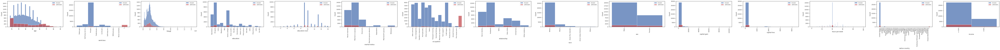

In [ ]:
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='whitegrid',color_codes=True)

plt.figure(figsize=(150,4))

count = 0
for i in real_data.columns:
    count += 1
    ax = plt.subplot(1, real_data.shape[1], count) #sharey=True
    sns.histplot(data=known_entries[i], kde=False, color='b', label="known", )
    entries = unknown_entries[i].sort_values(ascending = False)
    sns.histplot(data=entries, kde=False, color='r', label="unknown")
    plt.xticks(rotation=90)
    plt.legend(loc='upper right')
plt.show()


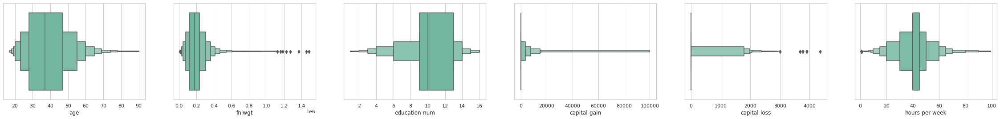

In [ ]:
# real_dataset['known_entries']
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='whitegrid',color_codes=True)
plt.figure(figsize=(40,4))

non_discrete_columns = [ col for col in real_data.columns if col not in discrete_columns]
count = 0
for col in non_discrete_columns:
    count += 1
    ax = plt.subplot(1, len(non_discrete_columns), count) #sharey=True
    ax = sns.boxenplot(data=known_entries, x=col, palette="Set2");
    # ax = sns.boxplot(data=known_entries, x=col, palette="Set2", hue='sex'); # dataset.sort_values(col),  palette="pastel", palette="Set2", palette="ch:.25"
    # ax = sns.swarmplot(data=known_entries, x=col, color=".25") #x="day", y="total_bill", 
# plt.title("Boxplot");
plt.show()

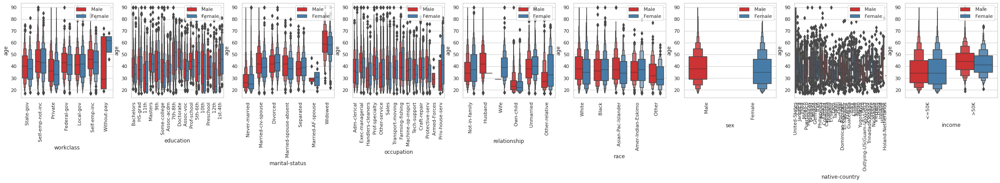

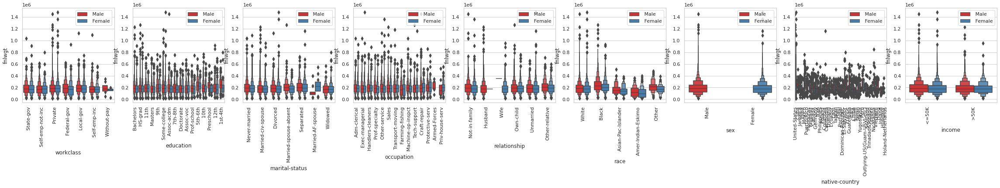

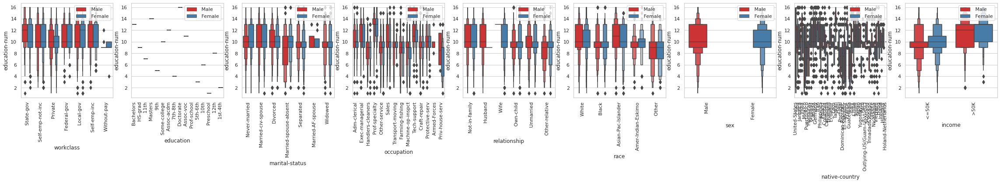

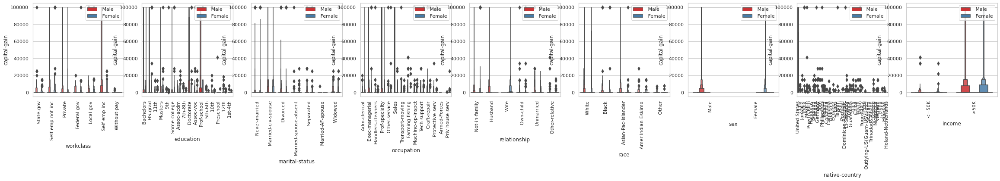

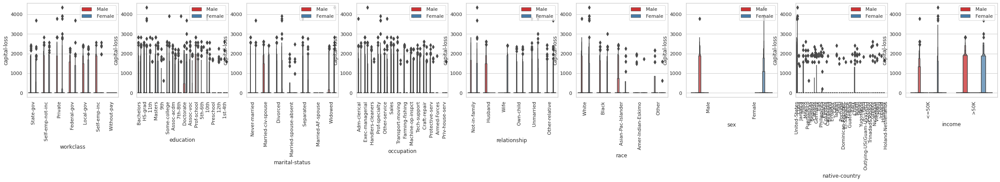

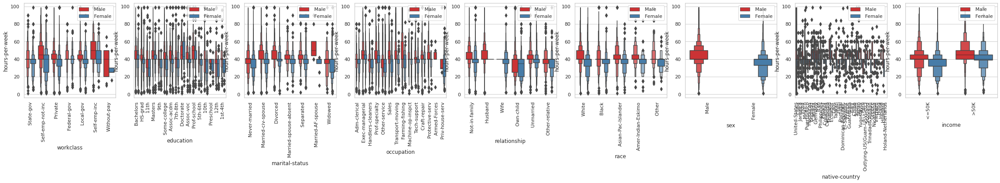

In [ ]:
# real_dataset['known_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=known_entries, x=col, y=col1, palette="Set1", hue='sex');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

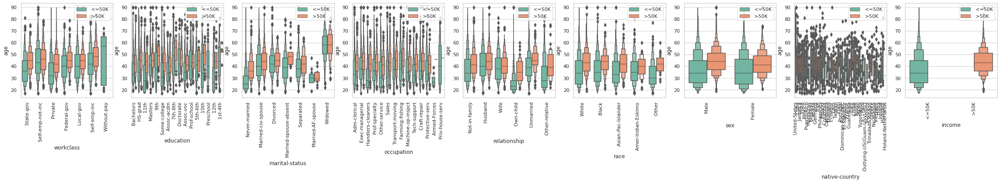

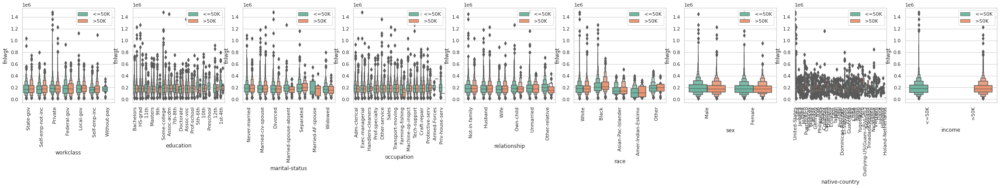

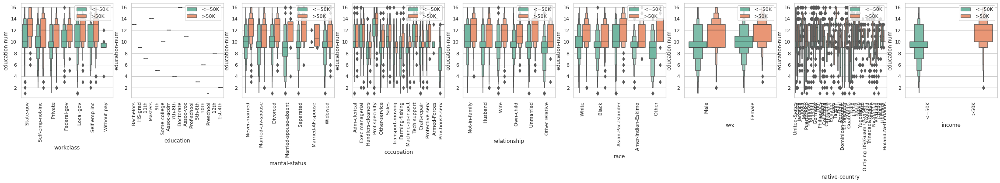

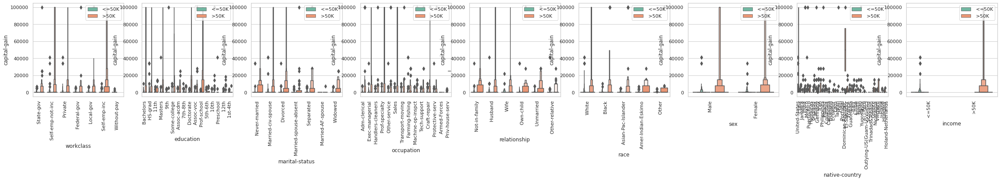

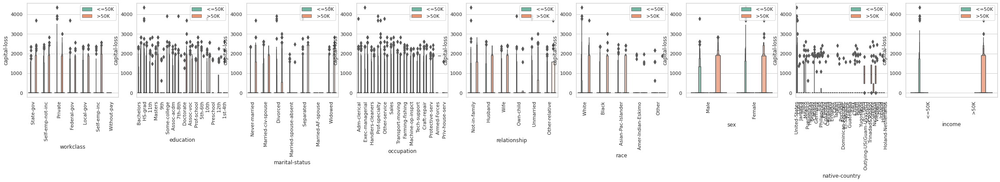

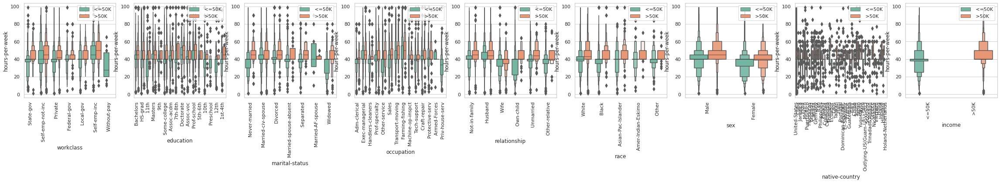

In [ ]:
# real_dataset['known_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=known_entries, x=col, y=col1, palette="Set2", hue='income');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

<Figure size 2880x288 with 0 Axes>

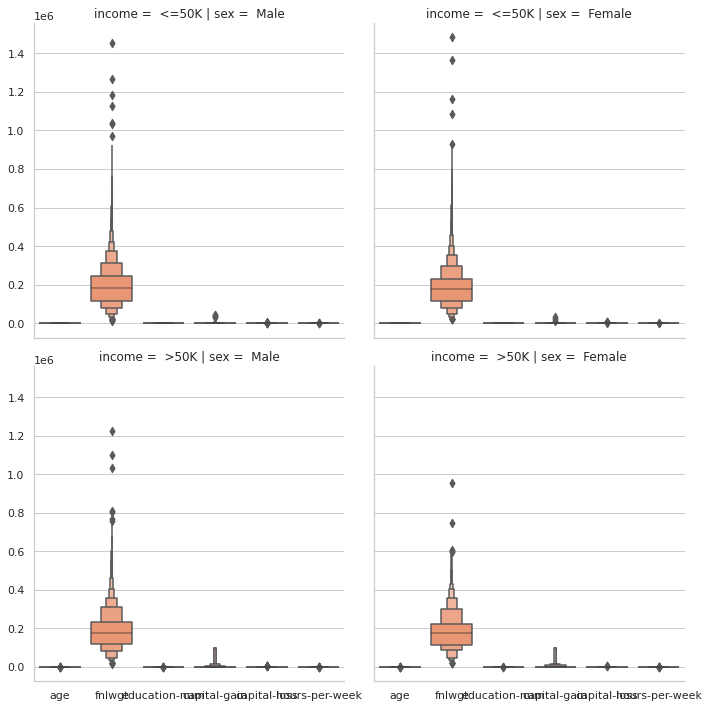

In [ ]:
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='whitegrid',color_codes=True)
plt.figure(figsize=(40,4))

# real_dataset['known_entries']
ax = sns.catplot(data=known_entries, kind="boxen", palette="Set2", col="sex", row="income") #kind="count", kind="bar", kind="violin", kind="boxen",
plt.show()
# ax = sns.catplot(data=known_entries, kind="violin", palette="Set2", col="sex", row="income", bw=.15, cut=0,) #kind="count", kind="bar", kind="violin", kind="boxen",
# plt.show()

# plt.figure(figsize=(100,1))
# ax = sns.catplot(data=known_entries, x=col, kind="count", palette="Set2") 
# plt.show()

# ax = sns.catplot(data=known_entries, x=col, kind="count", hue='sex', palette="Set2")  # hue='income'
# plt.show()

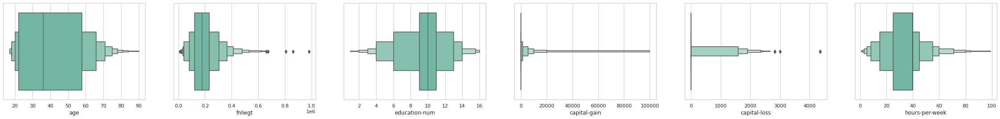

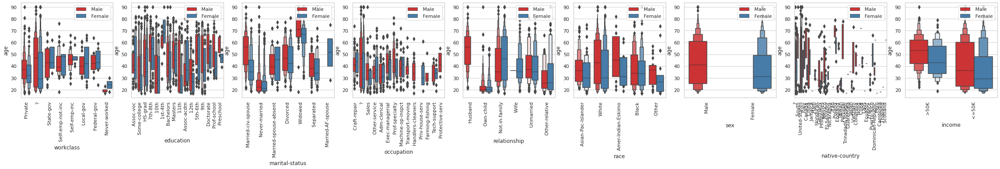

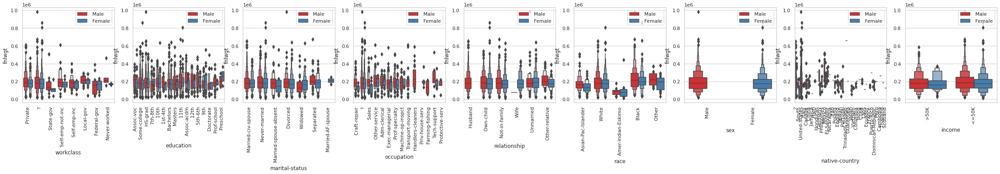

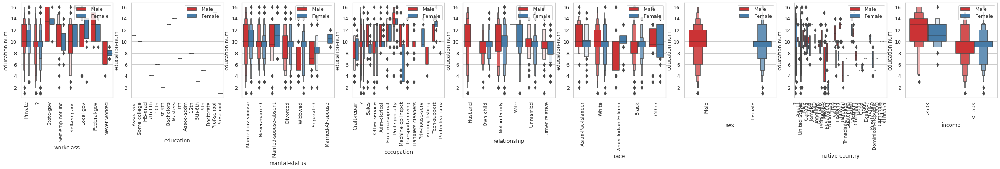

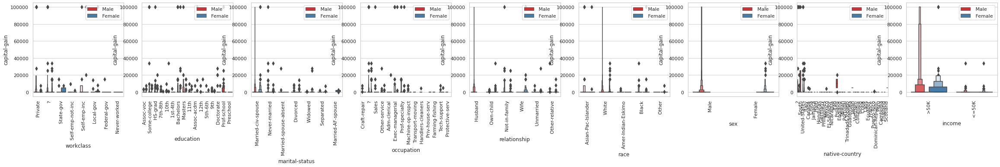

...

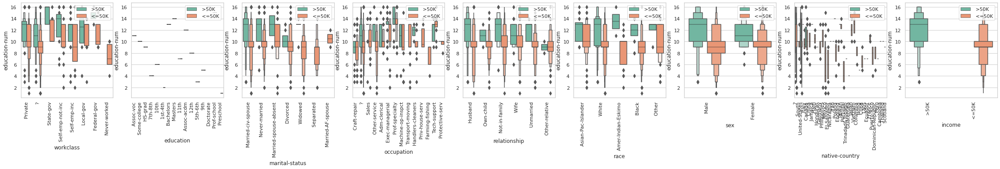

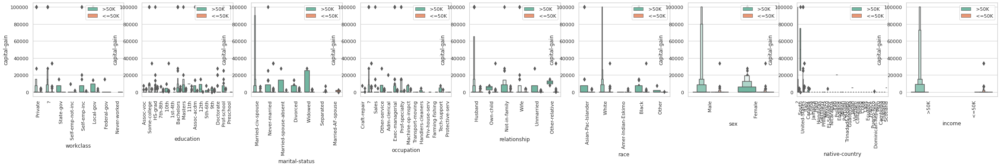

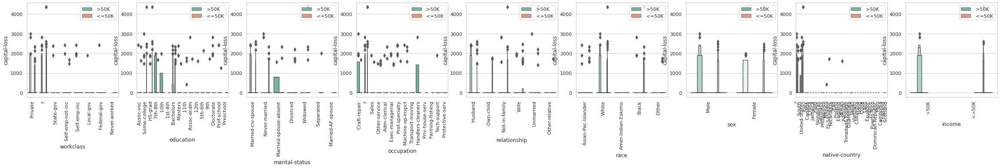

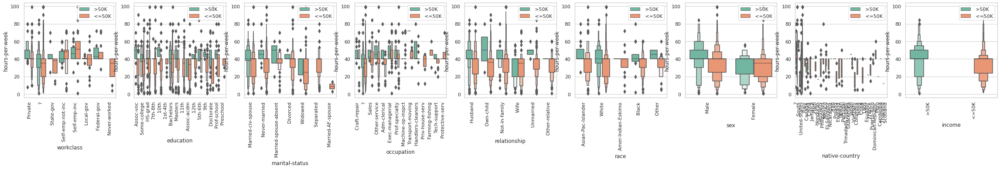

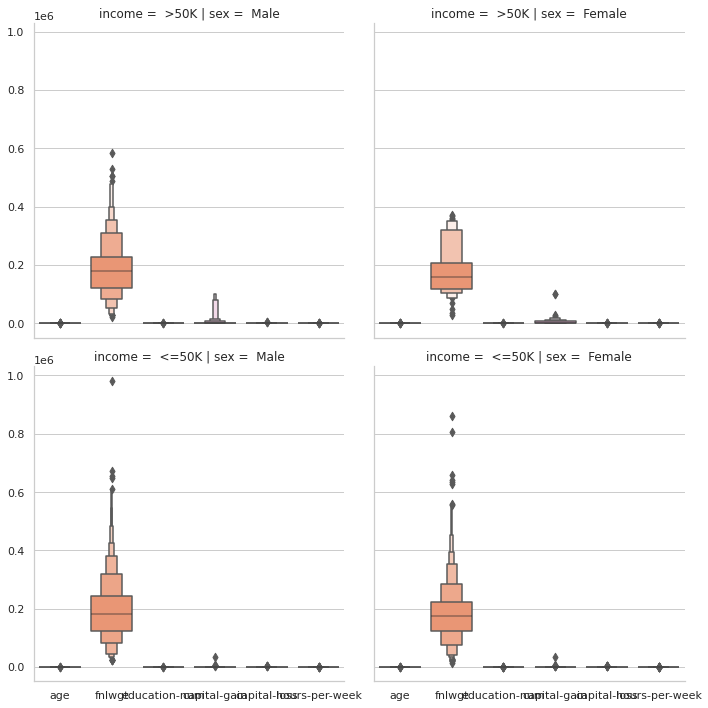

In [ ]:
# real_dataset['unknown_entries']
non_discrete_columns = [ col for col in real_data.columns if col not in discrete_columns]

plt.figure(figsize=(40,4))
count = 0
for col in non_discrete_columns:
    count += 1
    ax = plt.subplot(1, len(non_discrete_columns), count) #sharey=True
    ax = sns.boxenplot(data=unknown_entries, x=col, palette="Set2"); # orient="h"
    # ax = sns.boxplot(data=unknown_entries, x=col, palette="Set2", hue='sex'); # dataset.sort_values(col),  palette="pastel", palette="Set2", palette="ch:.25"
    # ax = sns.swarmplot(data=unknown_entries, x=col, color=".25") #x="day", y="total_bill", 
# plt.title("Boxplot");
plt.show()

# real_dataset['unknown_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=unknown_entries, x=col, y=col1, palette="Set1", hue='sex');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

# real_dataset['unknown_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=unknown_entries, x=col, y=col1, palette="Set2", hue='income');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

# real_dataset['unknown_entries']
ax = sns.catplot(data=unknown_entries, kind="boxen", palette="Set2", col="sex", row="income") #kind="count", kind="bar", kind="violin", kind="boxen",
plt.show()

<Figure size 1080x1080 with 0 Axes>

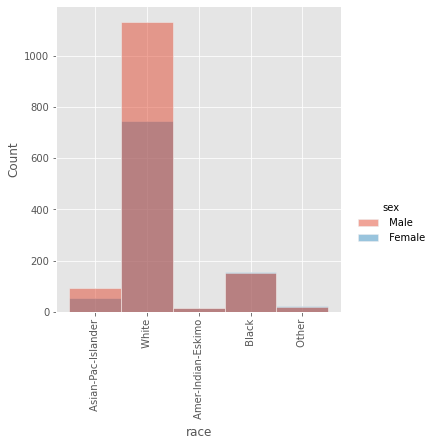

<Figure size 1080x1080 with 0 Axes>

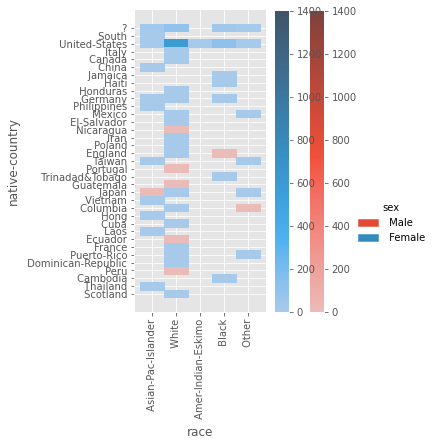

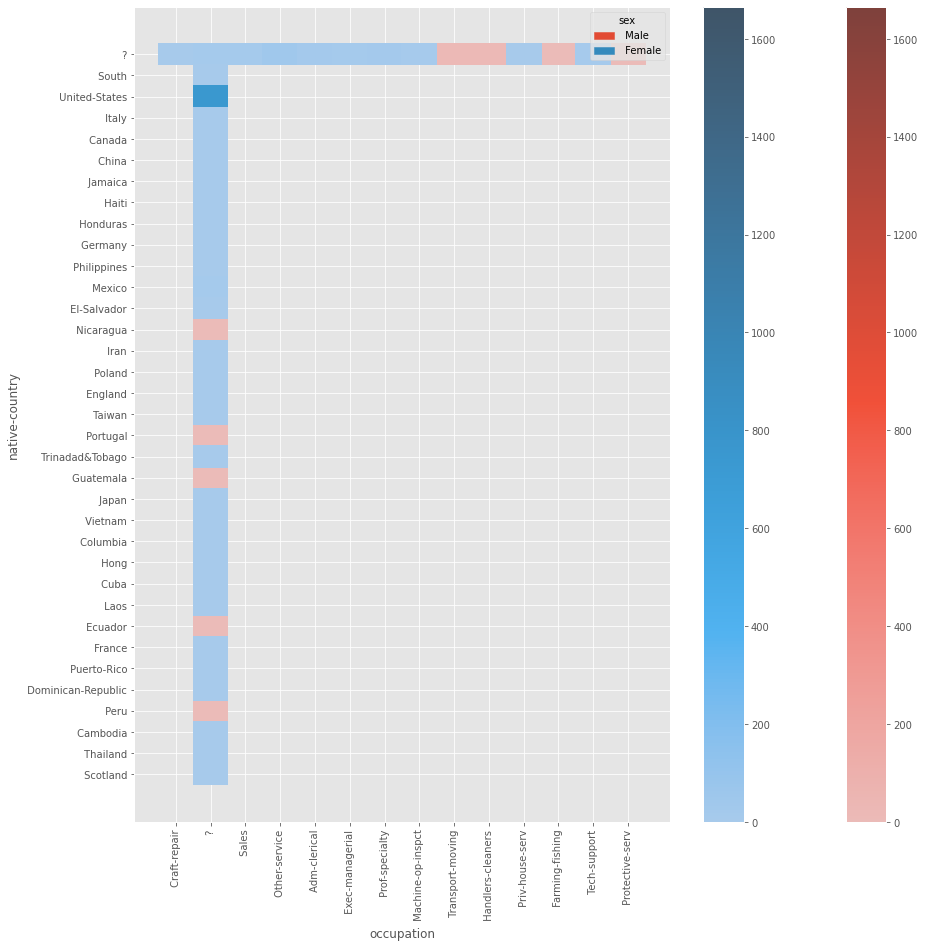

In [ ]:
plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="race", hue="sex") # , kde=True
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="race", y='native-country', hue="sex", cbar=True)
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.histplot(unknown_entries, x="occupation", y="native-country", hue="sex", cbar=True)
plt.xticks(rotation=90)

plt.show()

<Figure size 1080x1080 with 0 Axes>

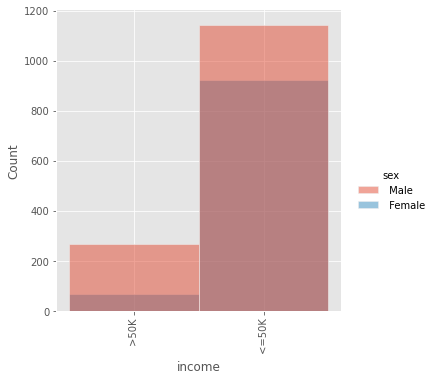

<Figure size 1080x1080 with 0 Axes>

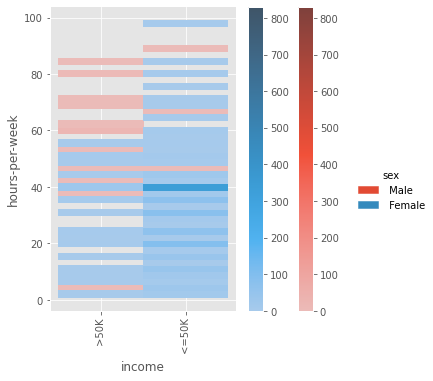

In [ ]:
plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="income", hue="sex")
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="income", y="hours-per-week", hue="sex", cbar=True)
plt.xticks(rotation=90)
plt.show()

In [ ]:
unknown_entries.corr()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
age,1.000000,-0.082974,0.001258,0.063787,0.044115,-0.112997
fnlwgt,-0.082974,1.000000,-0.023732,0.000518,-0.017045,0.019835
education-num,0.001258,-0.023732,1.000000,0.099788,0.078766,0.044557
capital-gain,0.063787,0.000518,0.099788,1.000000,-0.024169,0.057490
capital-loss,0.044115,-0.017045,0.078766,-0.024169,1.000000,0.066319
hours-per-week,-0.112997,0.019835,0.044557,0.057490,0.066319,1.000000


<Figure size 1080x1080 with 0 Axes>

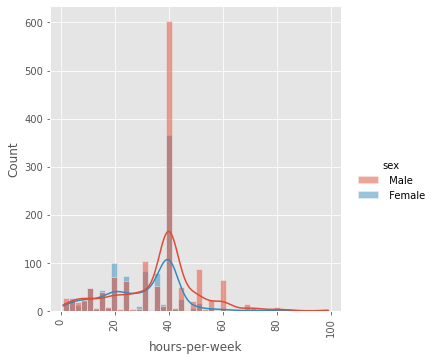

<Figure size 1080x1080 with 0 Axes>

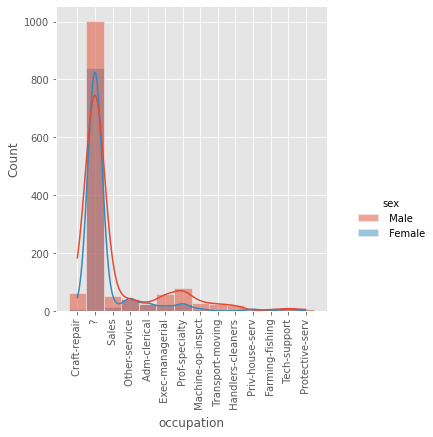

<Figure size 1080x1080 with 0 Axes>

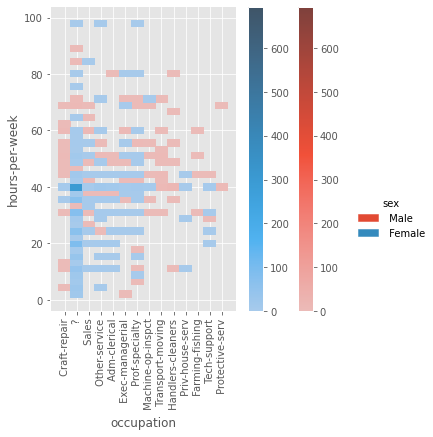

In [ ]:
plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="hours-per-week", hue="sex", kde=True) #workclass, occupation, race, hours-per-week, income
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="occupation", hue="sex", kde=True)
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="occupation", y="hours-per-week", hue="sex", cbar=True)
plt.xticks(rotation=90)

plt.show()

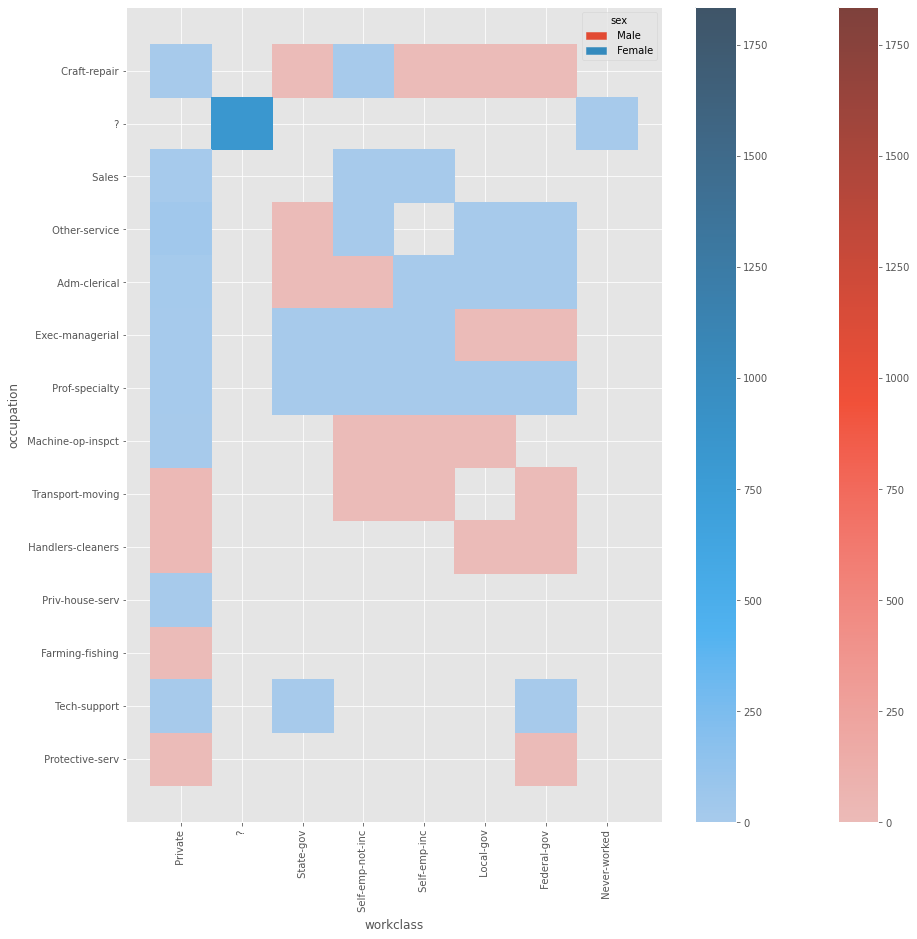

In [ ]:
plt.figure(figsize=(15,15))
sns.histplot(unknown_entries, x="workclass", y="occupation",hue="sex", cbar=True)
plt.xticks(rotation=90)
plt.show()

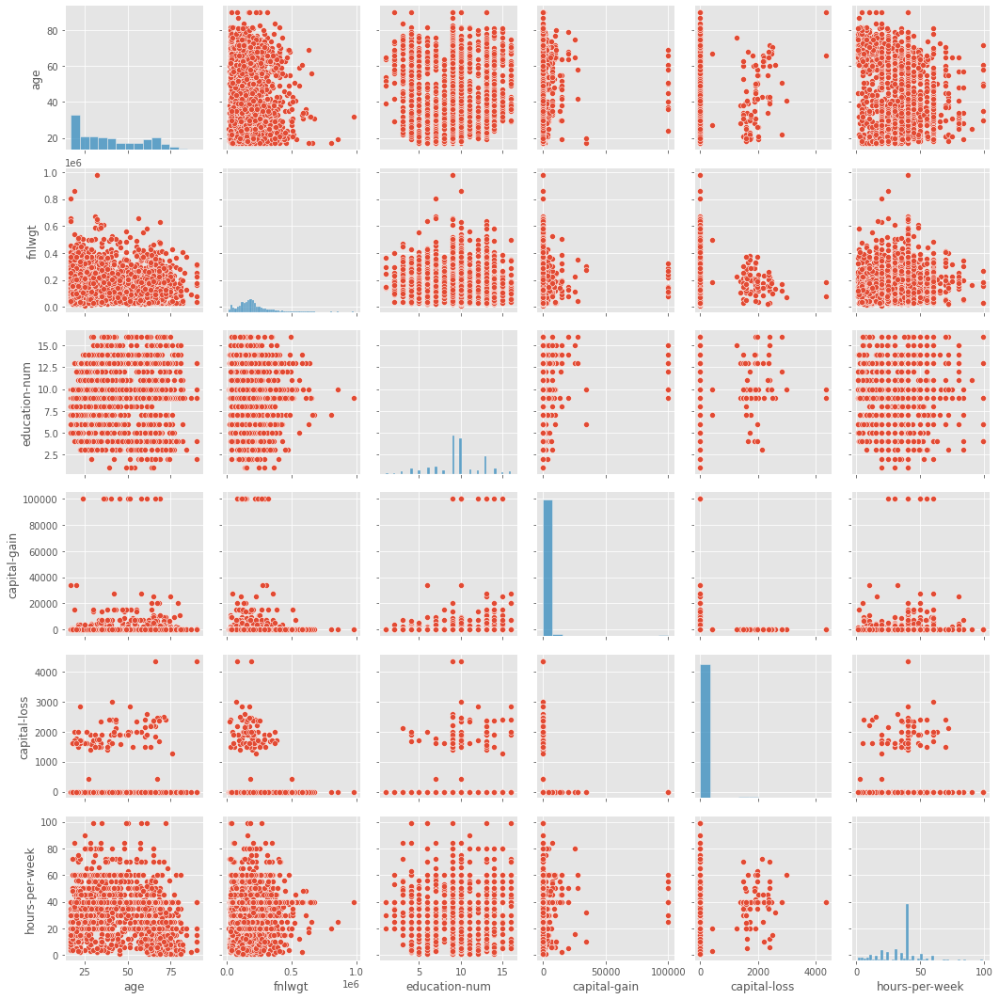

In [ ]:
# real_dataset['unknown_entries']
sns.pairplot(unknown_entries)

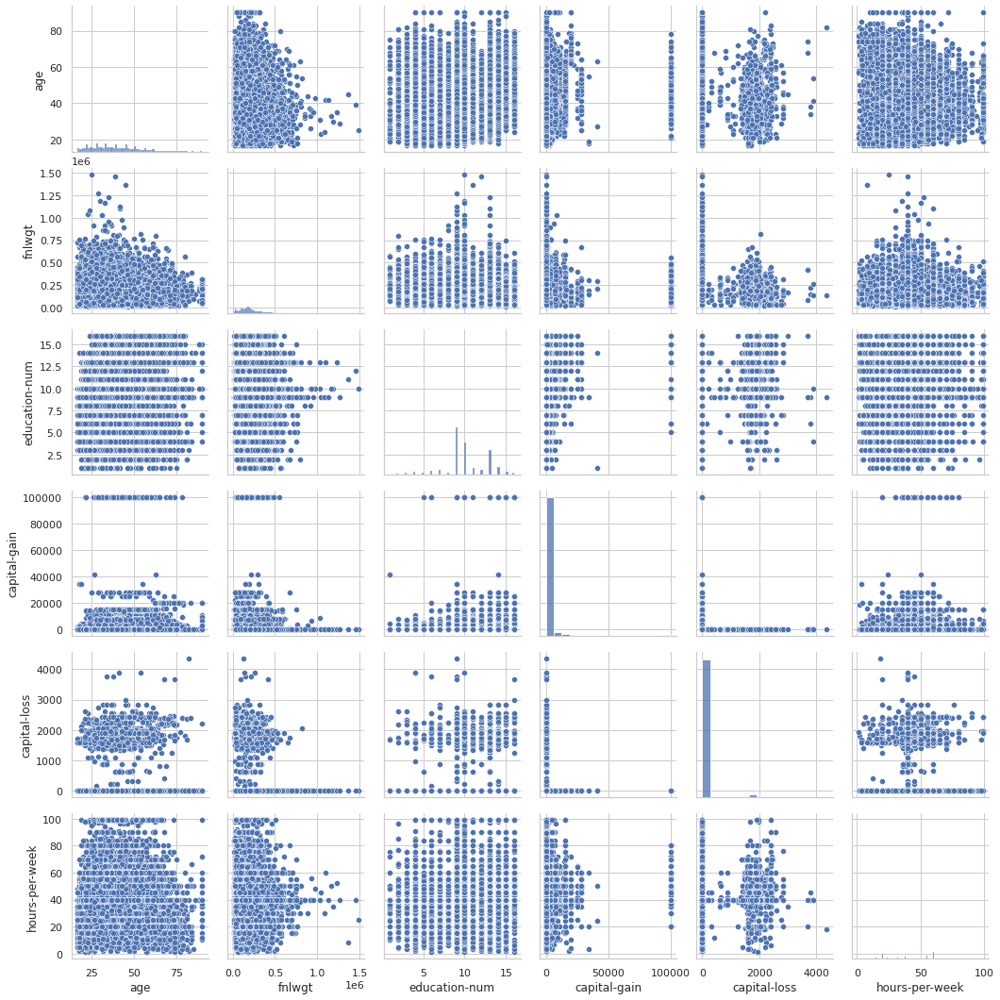

In [ ]:
# real_dataset['known_entries']
sns.pairplot(known_entries)

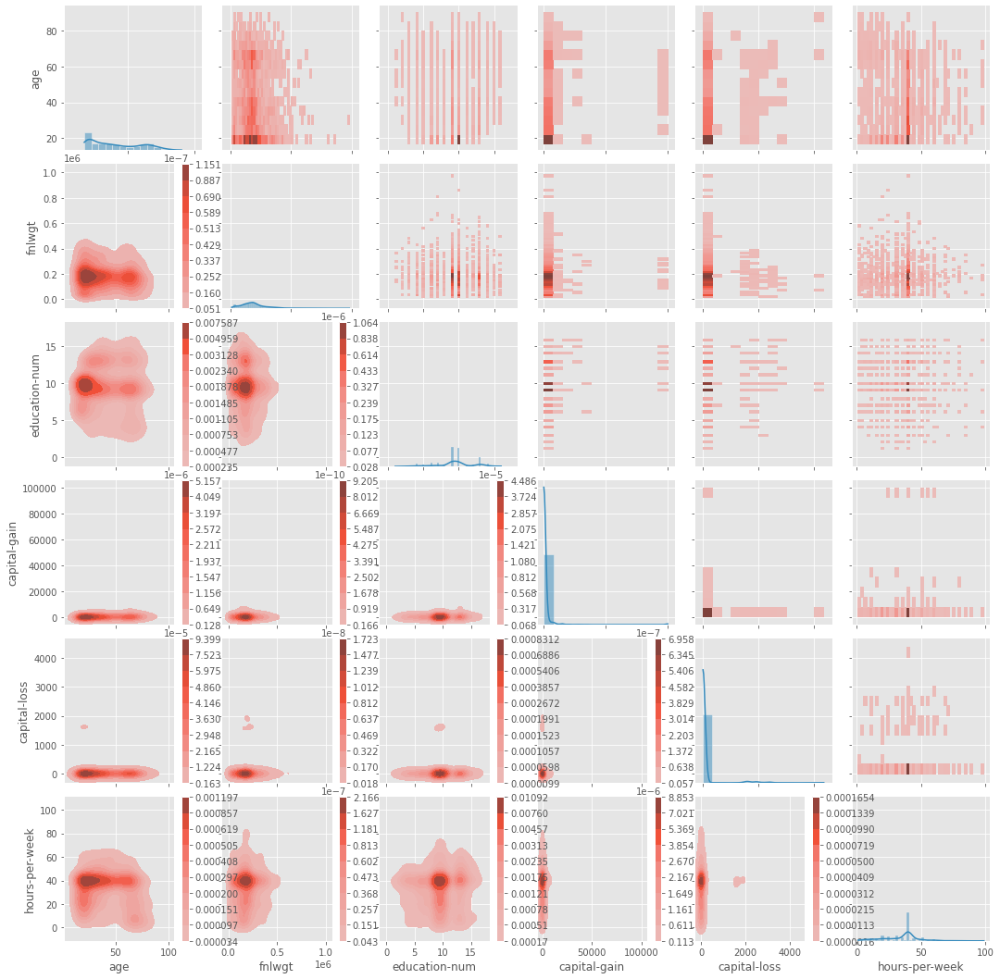

In [ ]:
g = sns.PairGrid(unknown_entries)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot, fill=True, cbar=True)
g.map_diag(sns.histplot, kde=True, cbar=True)

In [ ]:
# use CTGANSynthesizer to create a synthetic copy of this tabular data.
from ctgan import CTGANSynthesizer
import warnings
warnings.filterwarnings("ignore")

# Identifies all the discrete columns / categorical_columns

epochs = 10
num_samples = 3200

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(real_data, discrete_columns) # ctgan.fit(real_data, categorical_columns, epochs = 1000)

#generate synthetic data, 1000 rows of data
synthetic_data = ctgan.sample(num_samples)  # synthetic_data.to_csv('samples.csv') # synthetic_data1=synthetic_data.copy(); synthetic_data1.drop(synthetic_data1.columns[[0, 1, 2, 3]], axis = 1, inplace = True) 


In [ ]:
print(synthetic_data.head(5))

print(synthetic_data.tail(5))

In [ ]:
print(real_data.shape, synthetic_data.shape)

(32561, 15) (1000, 15)


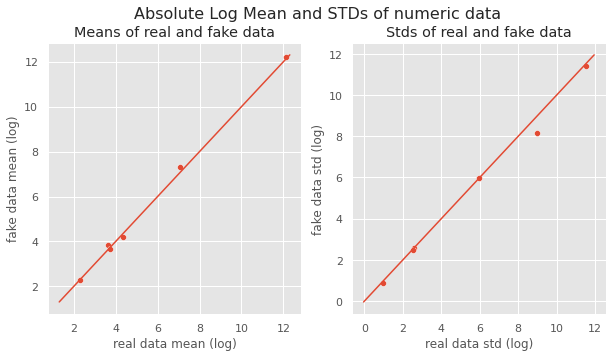

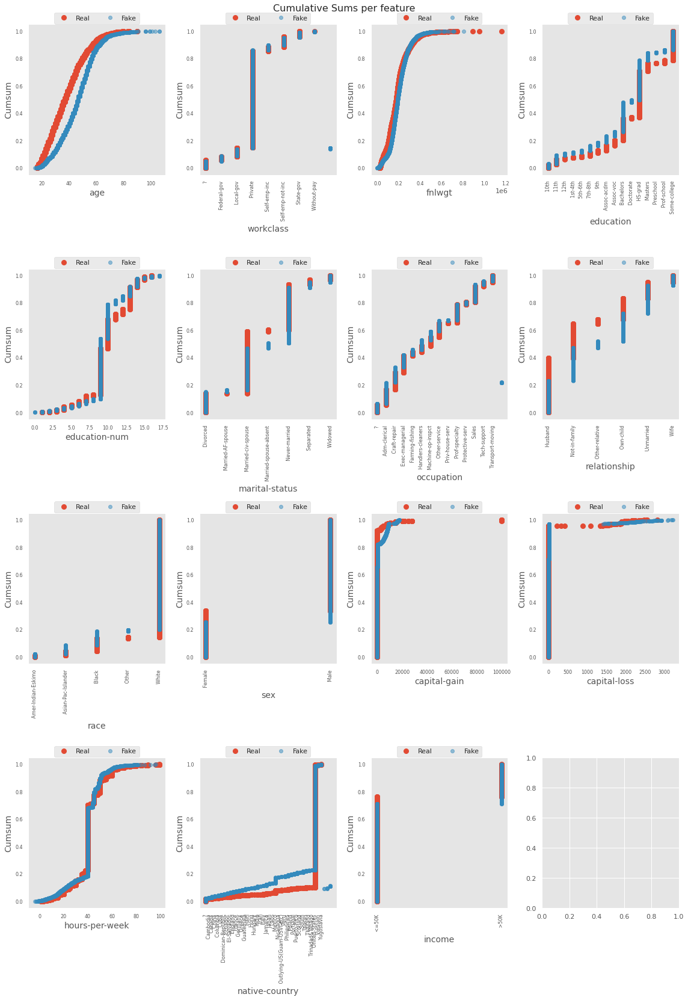

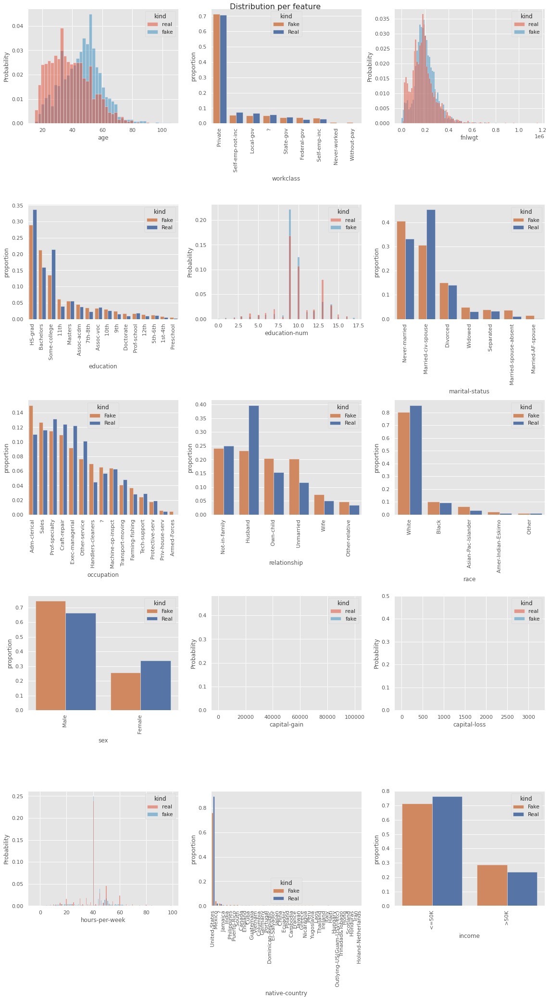

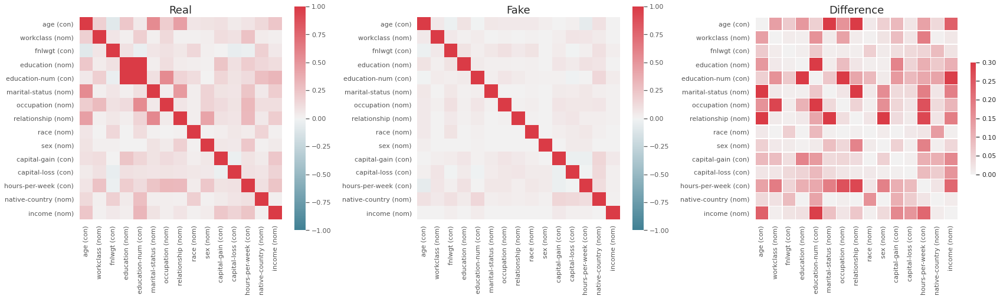

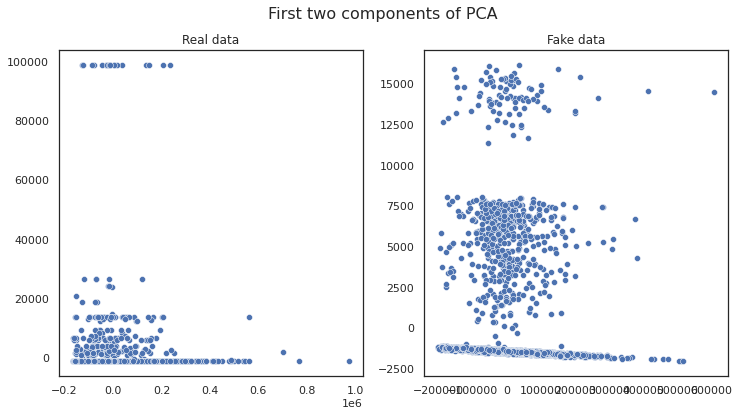

In [ ]:
import seaborn as sns
%matplotlib inline 
import matplotlib
matplotlib.style.use('ggplot')
from table_evaluator import load_data, TableEvaluator
table_evaluator = TableEvaluator(real_data, synthetic_data, cat_cols=discrete_columns) # categorical_columns = ['Irissetosa','Irisversicolor','Irisvirginica']; table_evaluator =  TableEvaluator(real_data, samples, cat_cols= categorical_columns)
table_evaluator.visual_evaluation()

# plt.subplot(....,  facecolor=(1, 1, 1))

In [ ]:
#print(table_evaluator)

In [ ]:
#to get the F1 scores and the Jaccard similarity score for each feature.
cols = 'income'
table_evaluator.evaluate(target_col=cols) 


Classifier F1-scores and their Jaccard similarities::
                             f1_real  f1_fake  jaccard_similarity
index                                                            
DecisionTreeClassifier_fake   0.6141   0.5578              0.4254
DecisionTreeClassifier_real   0.8141   0.6766              0.4849
LogisticRegression_fake       0.6578   0.7125              0.6431
LogisticRegression_real       0.7812   0.7703              0.8208
MLPClassifier_fake            0.6719   0.7125              0.8338
MLPClassifier_real            0.7984   0.7688              0.9190
RandomForestClassifier_fake   0.6672   0.6734              0.6495
RandomForestClassifier_real   0.8531   0.7219              0.6162

Privacy results:
                                         result
Duplicate rows between sets (real/fake)  (0, 0)
nearest neighbor mean                    2.3609
nearest neighbor std                     0.6762

Miscellaneous results:
                                  Result
Column Cor

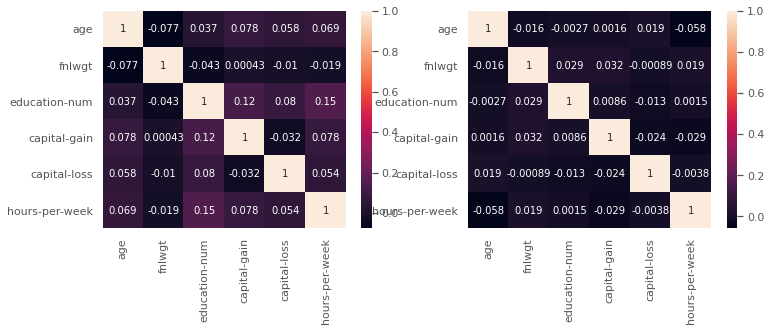

In [ ]:
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
corrMatrix = real_data.corr()
sns.heatmap(corrMatrix, annot=True)
#plt.show()
plt.subplot(1,2,2)
corrMatrix = synthetic_data.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

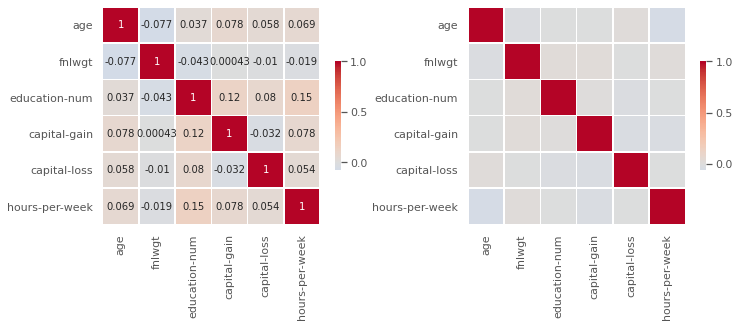

In [ ]:
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sns.heatmap(real_data.corr(), cmap='coolwarm', center=0,
              square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)

plt.subplot(1,2,2)
sns.heatmap(synthetic_data.corr(), cmap='coolwarm', center=0,
              square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)
plt.show()

In [ ]:
print(real_data.corr())

                     age    fnlwgt  education-num  capital-gain  capital-loss  \
age             1.000000 -0.076646       0.036527      0.077674      0.057775   
fnlwgt         -0.076646  1.000000      -0.043195      0.000432     -0.010252   
education-num   0.036527 -0.043195       1.000000      0.122630      0.079923   
capital-gain    0.077674  0.000432       0.122630      1.000000     -0.031615   
capital-loss    0.057775 -0.010252       0.079923     -0.031615      1.000000   
hours-per-week  0.068756 -0.018768       0.148123      0.078409      0.054256   

                hours-per-week  
age                   0.068756  
fnlwgt               -0.018768  
education-num         0.148123  
capital-gain          0.078409  
capital-loss          0.054256  
hours-per-week        1.000000  


In [ ]:
# # analyse synthetic dataset

# # describe all the entries containing unknown "?" values 
# unknown_cols = []
# for col in discrete_columns:
#     print('\n***', col)
#     print(True if "?" in "".join(synthetic_data[col].unique()) else False)
#     if "?" in "".join(synthetic_data[col].unique()):
#         unknown_cols.append(col)
#     print(synthetic_data[col].describe(include=['O']))
#     print(synthetic_data[col].value_counts())



*** workclass
True
count         3200
unique           9
top        Private
freq          2267
Name: workclass, dtype: object
 Private             2267
 Local-gov            193
 Self-emp-not-inc     186
 ?                    129
 Self-emp-inc         128
 Federal-gov          111
 State-gov            110
 Without-pay           52
 Never-worked          24
Name: workclass, dtype: int64

*** education
False
count              3200
unique               16
top        Some-college
freq                971
Name: education, dtype: object
 Some-college    971
 HS-grad         749
 Bachelors       388
 Assoc-voc       164
 Masters         161
 11th            120
 7th-8th         116
 Assoc-acdm      114
 9th              91
 Prof-school      73
 10th             71
 Doctorate        63
 1st-4th          35
 12th             34
 5th-6th          32
 Preschool        18
Name: education, dtype: int64

*** marital-status
False
count               3200
unique                 7
top        Never-ma

In [ ]:
# obtain locations for entries containing unknown "?" values
unknown_loc = []
for col in discrete_columns:
    unknown_loc.extend(synthetic_data[synthetic_data[col] == " ?"].index.tolist())
unknown_loc = sorted(set(unknown_loc))
known_loc = [x for x in range(0, len(synthetic_data))
                              if x not in set(unknown_loc)]
# print(unknown_loc)
# print(known_loc)

# # obtain locations for entries containing unknown "?" values
# unknown_loc = []
# for col in unknown_cols:
#     unknown_loc.extend(synthetic_data[synthetic_data[col] == " ?"].index.tolist())
# unknown_loc = sorted(set(unknown_loc))
# known_loc = [x for x in range(0, len(synthetic_data))
#                               if x not in set(unknown_loc)]
# # print(unknown_loc)
# # print(known_loc)

In [ ]:
# extract all the entries containing unknown "?" values # real_data[real_data.isna()].dropna() #.fillna("?")
unknown_entries = synthetic_data.loc[unknown_loc].copy().reset_index(drop=True)
print(unknown_entries)

# extract all the entries without any unknown "?" values
known_entries = synthetic_data.loc[known_loc].copy().reset_index(drop=True)
print(known_entries)

# store to synthetic_dataset dict # synthetic_dataset['unknown_entries']
synthetic_dataset = {'unknown_entries': unknown_entries, 'known_entries': known_entries}

     age workclass  fnlwgt      education  education-num       marital-status  \
0     18         ?  236318        Masters              5        Never-married   
1     37         ?  188102        Masters             10        Never-married   
2     20         ?  163345      Bachelors             13   Married-civ-spouse   
3     32         ?   33727        HS-grad             10   Married-civ-spouse   
4     21   Private   75606      Bachelors             13   Married-civ-spouse   
..   ...       ...     ...            ...            ...                  ...   
529   32         ?  159714        HS-grad              9   Married-civ-spouse   
530   48         ?  394791      Assoc-voc             12   Married-civ-spouse   
531   16         ?  250166   Some-college              9   Married-civ-spouse   
532   31         ?  153826        HS-grad             12   Married-civ-spouse   
533   30   Private  574545     Assoc-acdm             13   Married-civ-spouse   

             occupation    

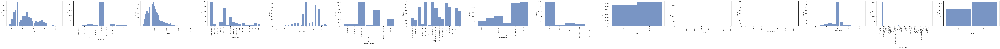

In [ ]:
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='ticks',color_codes=True)
# plot for all the entries containing unknown "?" values
plt.figure(figsize=(150,4))
entries = synthetic_data

count = 0
for i in entries.columns:
    count += 1
    ax = plt.subplot(1, entries.shape[1], count)
    sns.histplot(entries[i].sort_values(ascending = False), kde=False)
    plt.xticks(rotation=90)

plt.show()

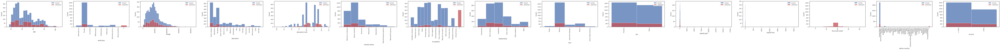

In [ ]:
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='ticks',color_codes=True)

plt.figure(figsize=(150,4))

count = 0
for i in synthetic_data.columns:
    count += 1
    ax = plt.subplot(1, synthetic_data.shape[1], count) #sharey=True
    sns.histplot(data=known_entries[i], kde=False, color='b', label="known")
    entries = unknown_entries[i].sort_values(ascending = False)
    sns.histplot(data=entries, kde=False, color='r', label="unknown")
    plt.xticks(rotation=90)
    plt.legend(loc='upper right')
plt.show()

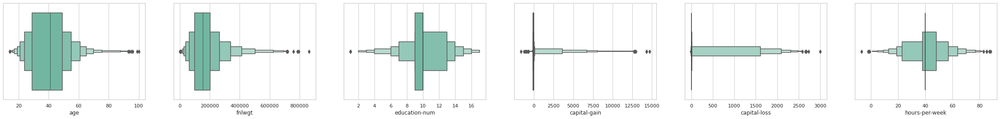

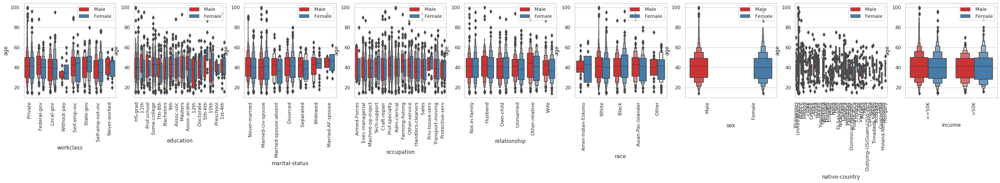

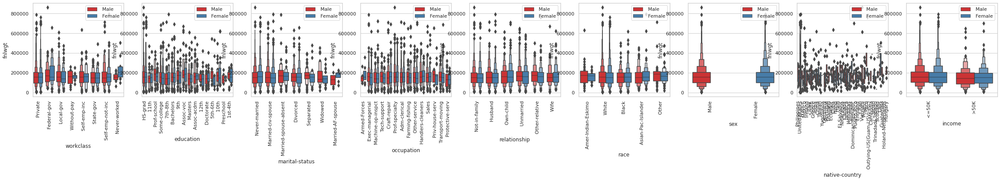

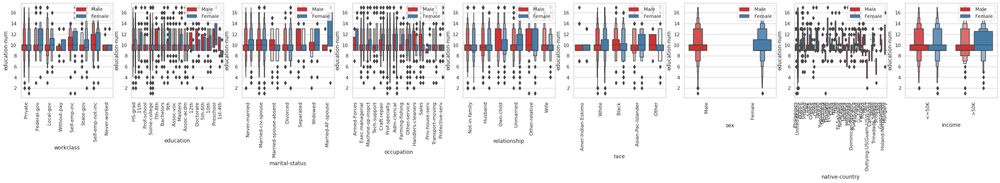

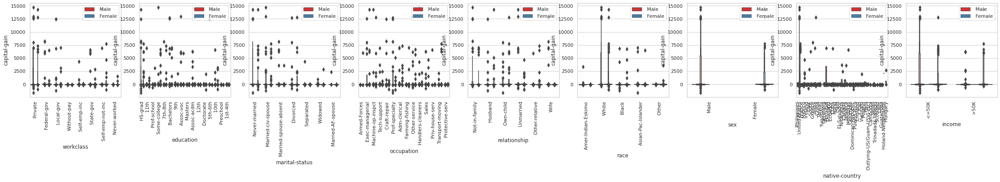

...

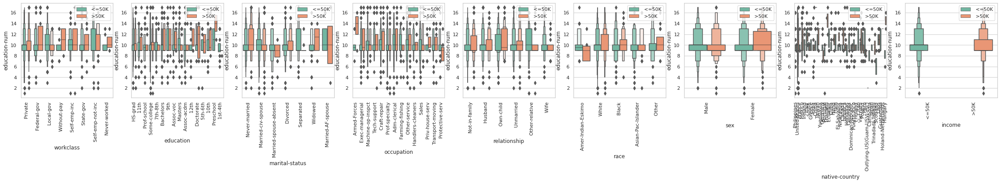

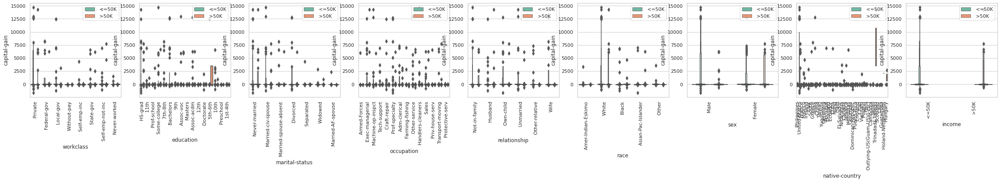

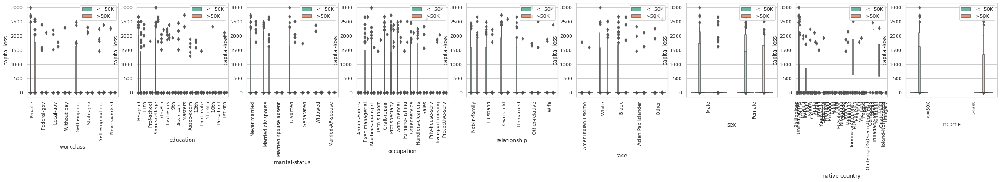

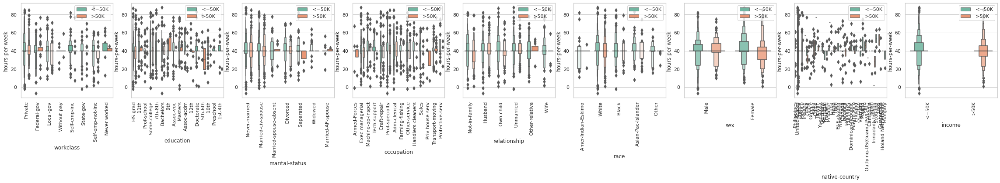

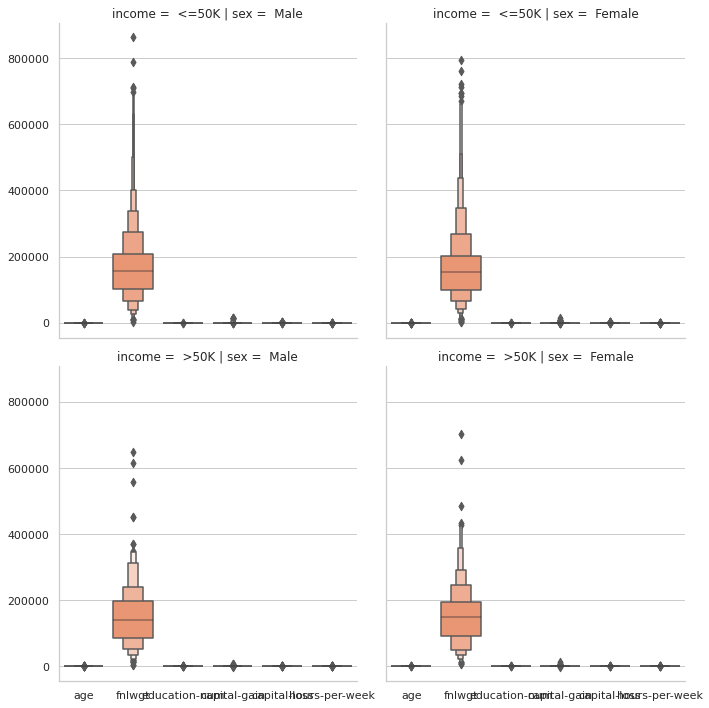

In [ ]:
# synthetic_dataset['known_entries']
non_discrete_columns = [ col for col in real_data.columns if col not in discrete_columns]

plt.figure(figsize=(40,4))
count = 0
for col in non_discrete_columns:
    count += 1
    ax = plt.subplot(1, len(non_discrete_columns), count) #sharey=True
    ax = sns.boxenplot(data=known_entries, x=col, palette="Set2"); # orient="h"
    # ax = sns.boxplot(data=known_entries, x=col, palette="Set2", hue='sex'); # dataset.sort_values(col),  palette="pastel", palette="Set2", palette="ch:.25"
    # ax = sns.swarmplot(data=known_entries, x=col, color=".25") #x="day", y="total_bill", 
# plt.title("Boxplot");
plt.show()

# synthetic_dataset['known_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=known_entries, x=col, y=col1, palette="Set1", hue='sex');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

# synthetic_dataset['known_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=known_entries, x=col, y=col1, palette="Set2", hue='income');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

# synthetic_dataset['known_entries']
ax = sns.catplot(data=known_entries, kind="boxen", palette="Set2", col="sex", row="income") #kind="count", kind="bar", kind="violin", kind="boxen",
plt.show()

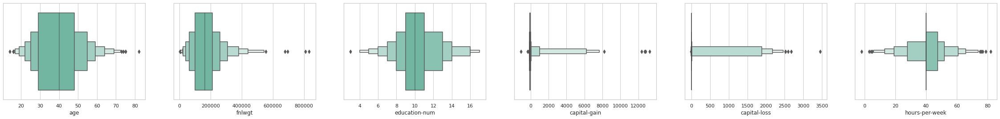

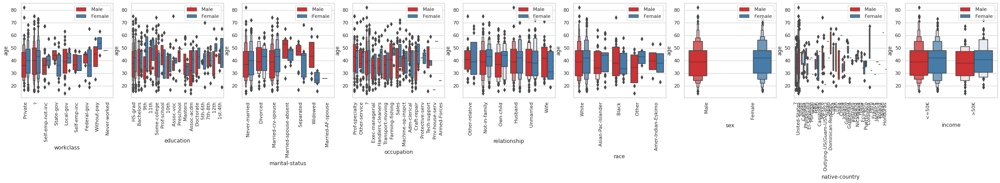

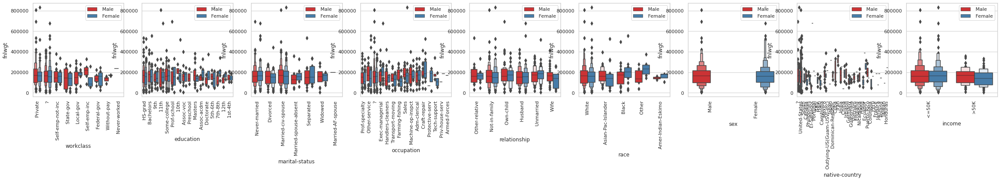

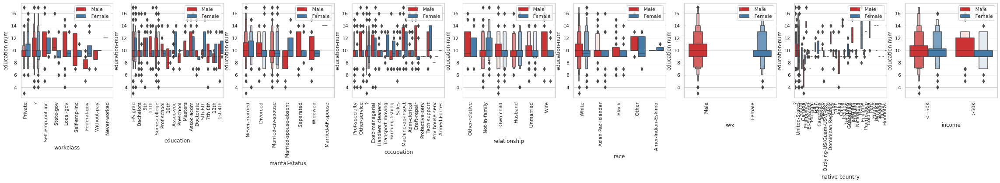

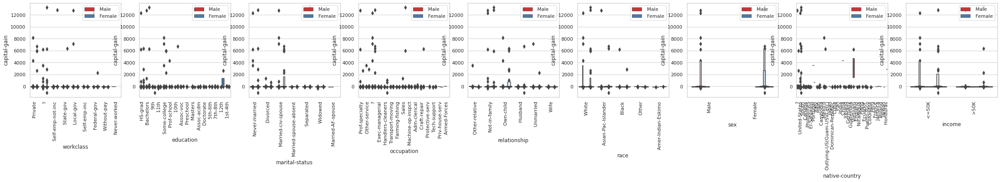

...

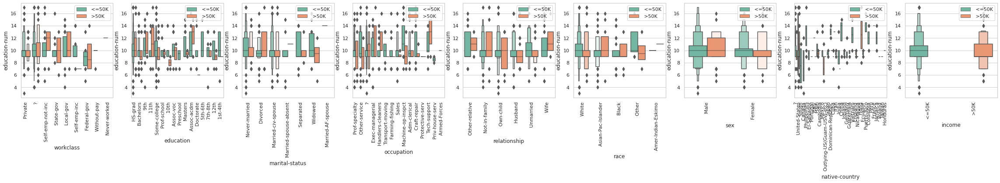

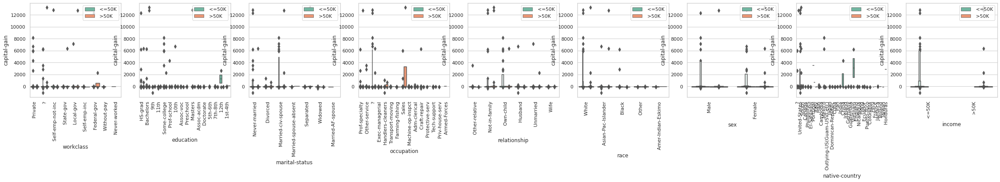

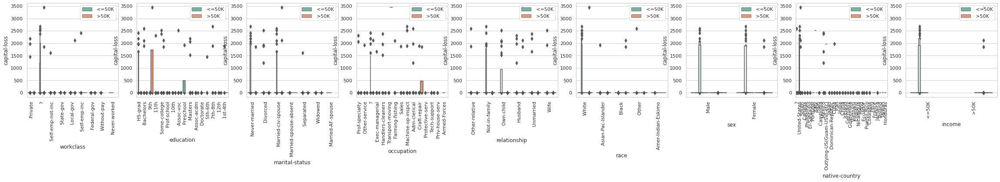

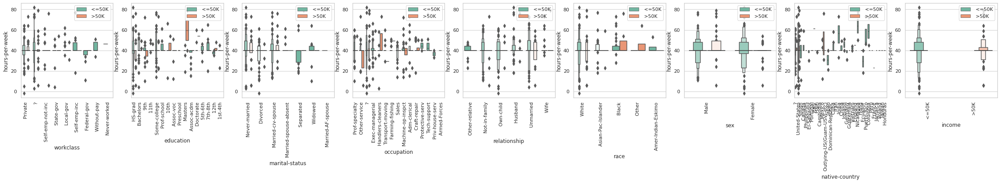

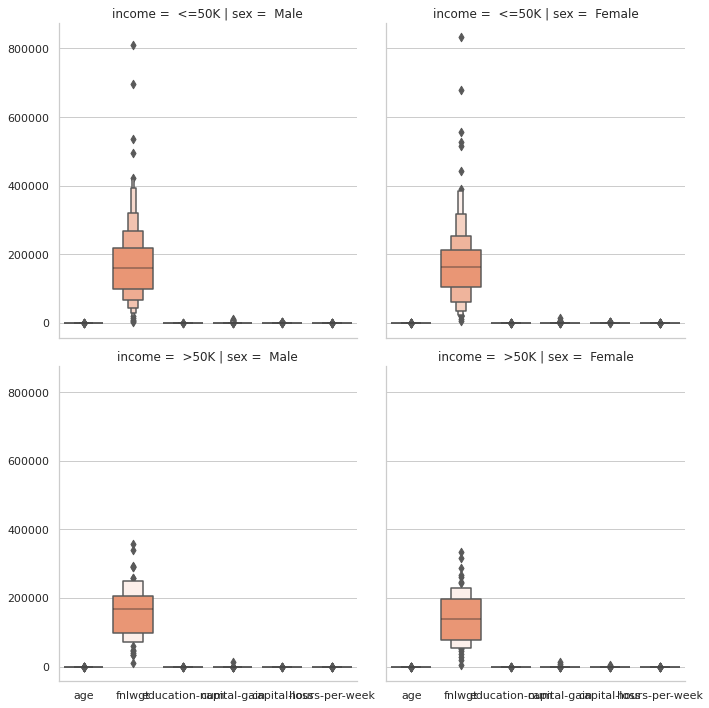

In [ ]:
# synthetic_dataset['unknown_entries']
non_discrete_columns = [ col for col in real_data.columns if col not in discrete_columns]

plt.figure(figsize=(40,4))
count = 0
for col in non_discrete_columns:
    count += 1
    ax = plt.subplot(1, len(non_discrete_columns), count) #sharey=True
    ax = sns.boxenplot(data=unknown_entries, x=col, palette="Set2"); # orient="h"
    # ax = sns.boxplot(data=unknown_entries, x=col, palette="Set2", hue='sex'); # dataset.sort_values(col),  palette="pastel", palette="Set2", palette="ch:.25"
    # ax = sns.swarmplot(data=unknown_entries, x=col, color=".25") #x="day", y="total_bill", 
# plt.title("Boxplot");
plt.show()

# synthetic_dataset['unknown_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=unknown_entries, x=col, y=col1, palette="Set1", hue='sex');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

# synthetic_dataset['unknown_entries']
for col1 in non_discrete_columns:
    plt.figure(figsize=(40,4))
    count = 0
    for col in discrete_columns:
        count += 1
        ax = plt.subplot(1, len(discrete_columns), count) 
        ax = sns.boxenplot(data=unknown_entries, x=col, y=col1, palette="Set2", hue='income');
        plt.xticks(rotation=90)
        plt.legend(loc='upper right')
    plt.show()

# synthetic_dataset['unknown_entries']
ax = sns.catplot(data=unknown_entries, kind="boxen", palette="Set2", col="sex", row="income") #kind="count", kind="bar", kind="violin", kind="boxen",
plt.show()

<Figure size 1080x1080 with 0 Axes>

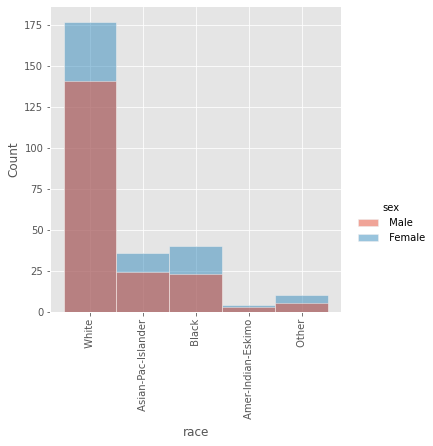

<Figure size 1080x1080 with 0 Axes>

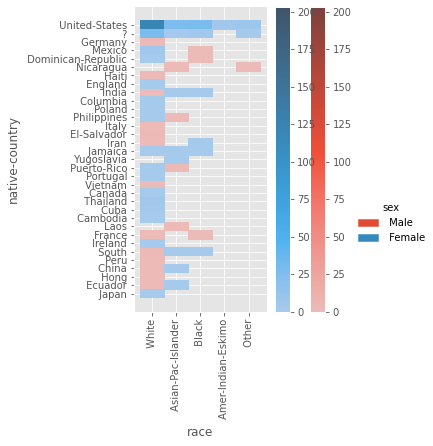

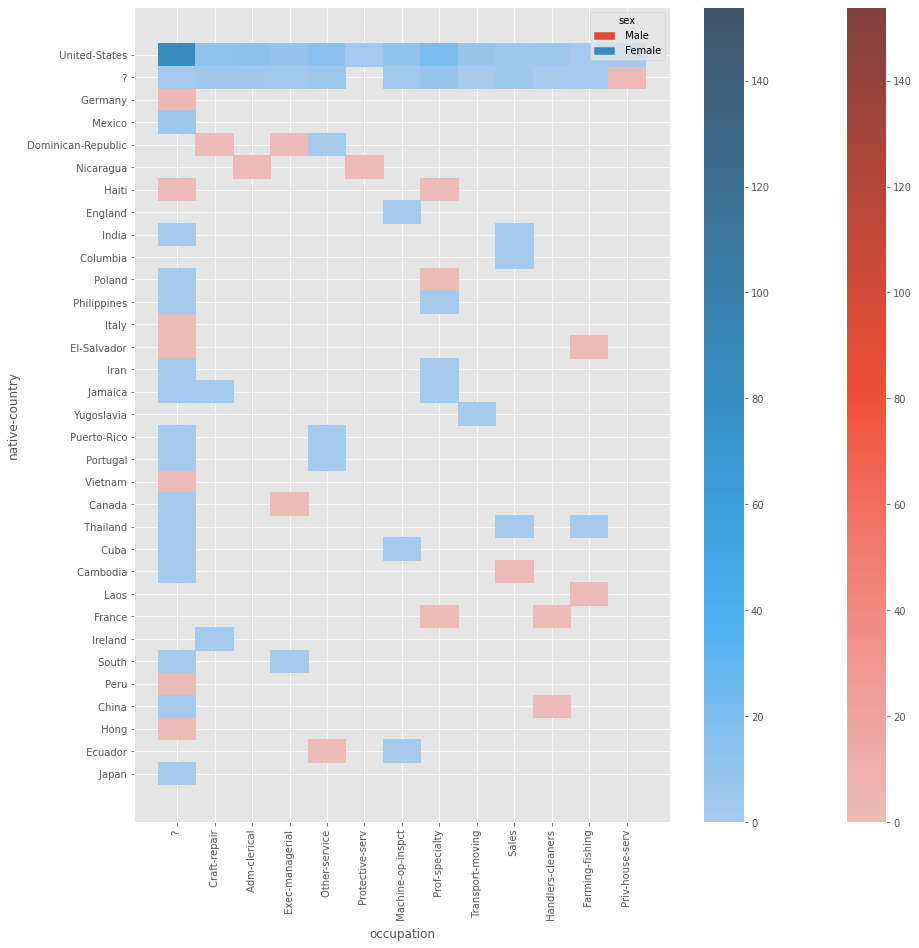

In [ ]:
plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="race", hue="sex") 
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="race", y='native-country', hue="sex", cbar=True)
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.histplot(unknown_entries, x="occupation", y="native-country", hue="sex", cbar=True)
plt.xticks(rotation=90)
plt.show()

<Figure size 1080x1080 with 0 Axes>

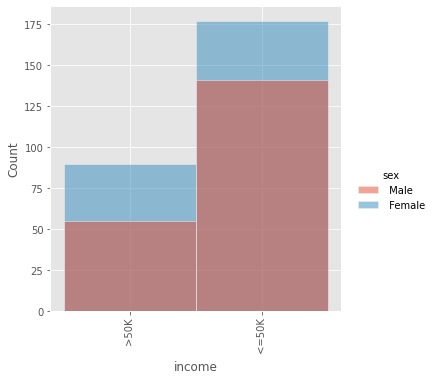

<Figure size 1080x1080 with 0 Axes>

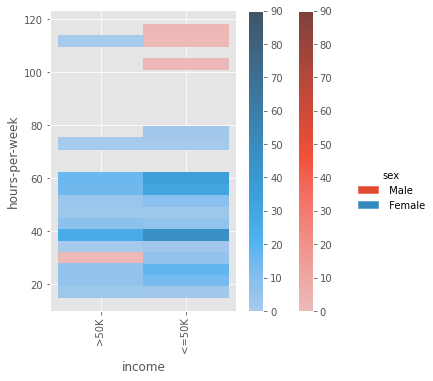

In [ ]:
plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="income", hue="sex")
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="income", y="hours-per-week", hue="sex", cbar=True)
plt.xticks(rotation=90)
plt.show()

<Figure size 1080x1080 with 0 Axes>

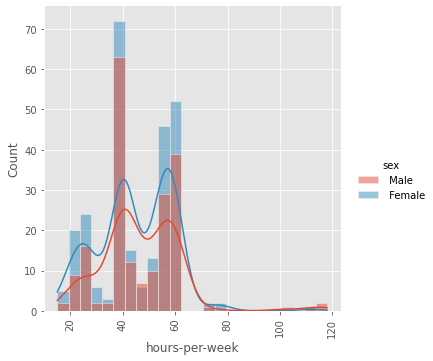

<Figure size 1080x1080 with 0 Axes>

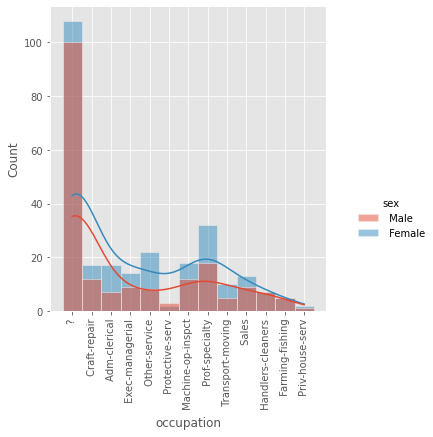

<Figure size 1080x1080 with 0 Axes>

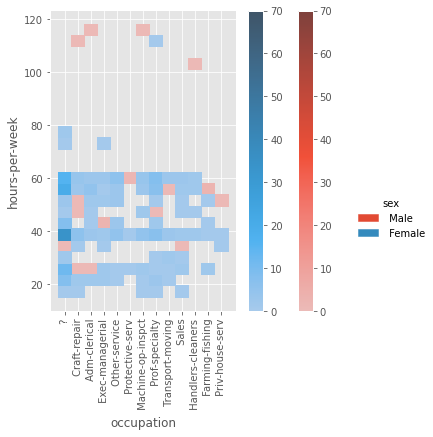

In [ ]:
plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="hours-per-week", hue="sex", kde=True) 
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="occupation", hue="sex", kde=True)
plt.xticks(rotation=90)

plt.figure(figsize=(15,15))
sns.displot(unknown_entries, x="occupation", y="hours-per-week", hue="sex", cbar=True)
plt.xticks(rotation=90)

plt.show()


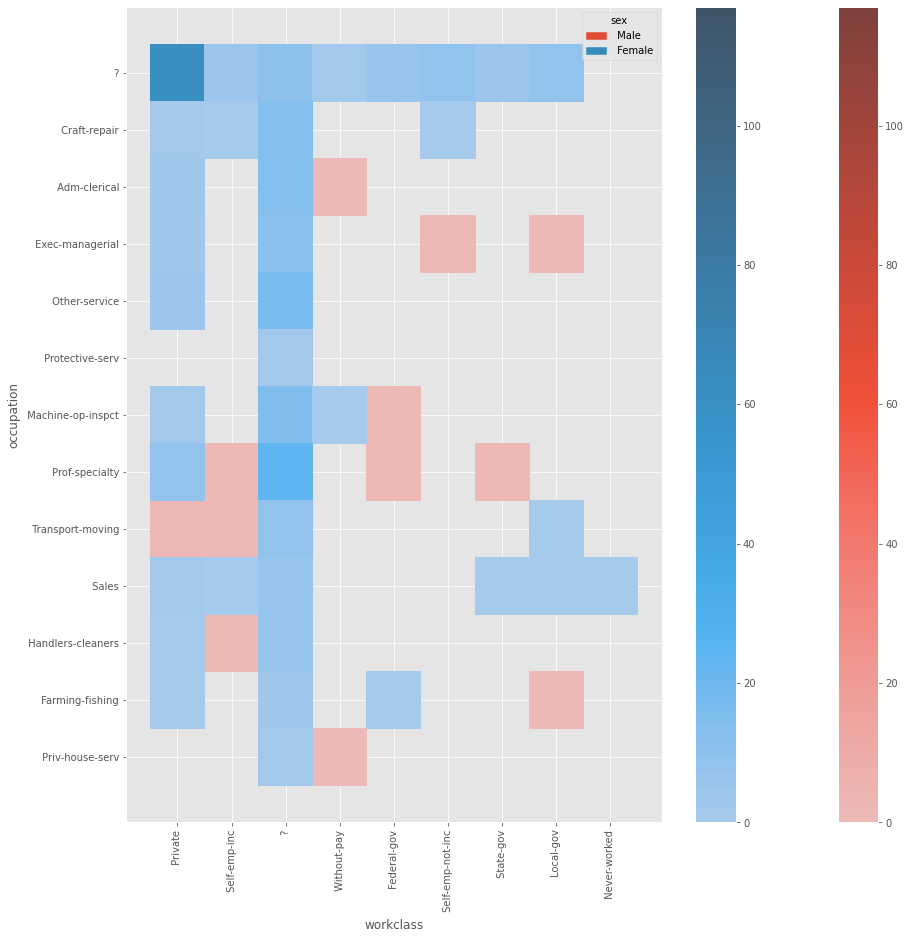

In [ ]:
plt.figure(figsize=(15,15))
sns.histplot(unknown_entries, x="workclass", y="occupation",hue="sex", cbar=True)
plt.xticks(rotation=90)
plt.show()

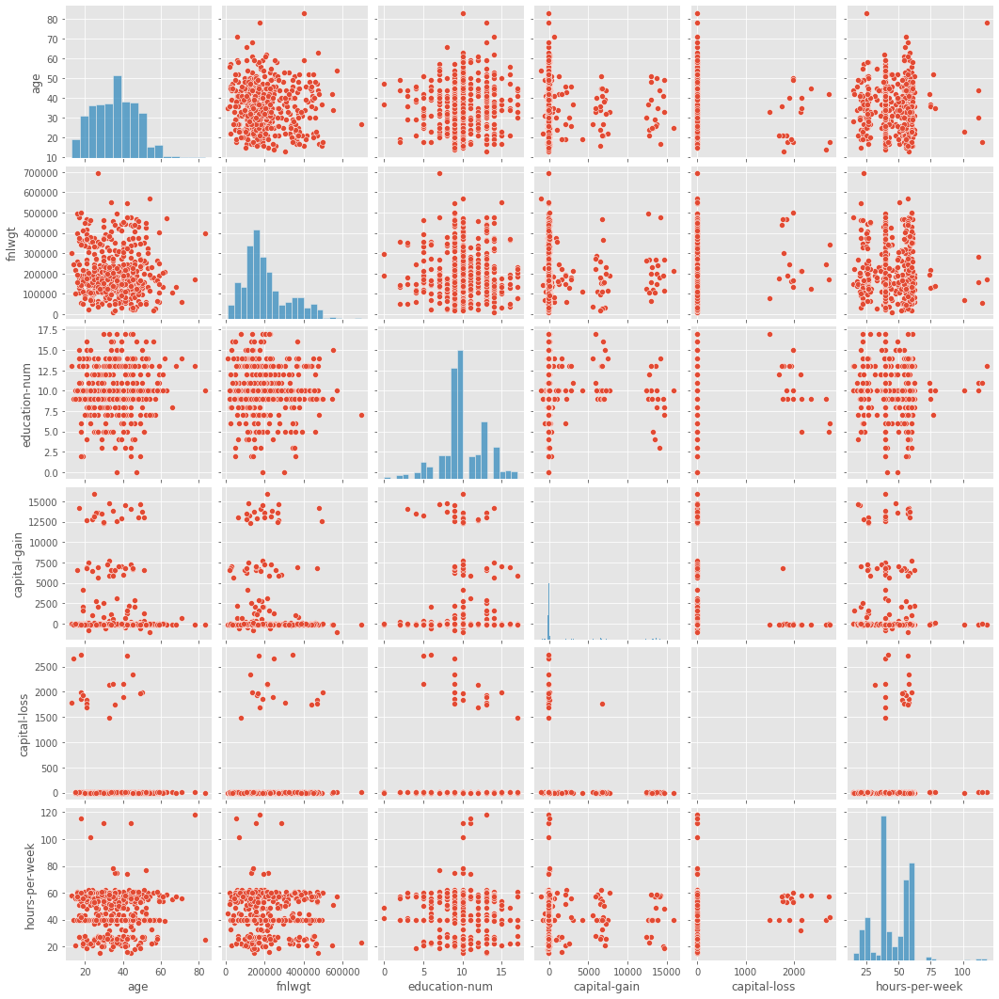

In [ ]:
# synthetic_dataset['unknown_entries']
sns.pairplot(unknown_entries)

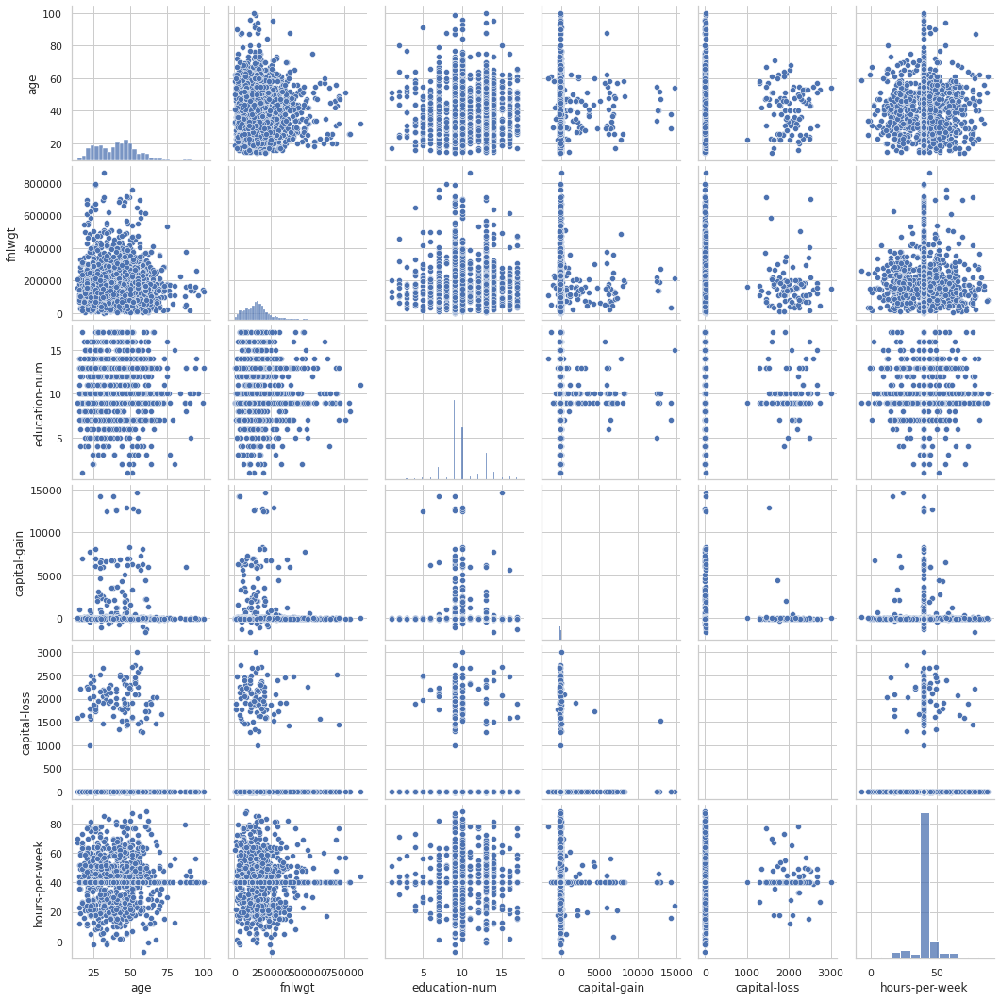

In [ ]:
# synthetic_dataset['known_entries']
sns.pairplot(known_entries)

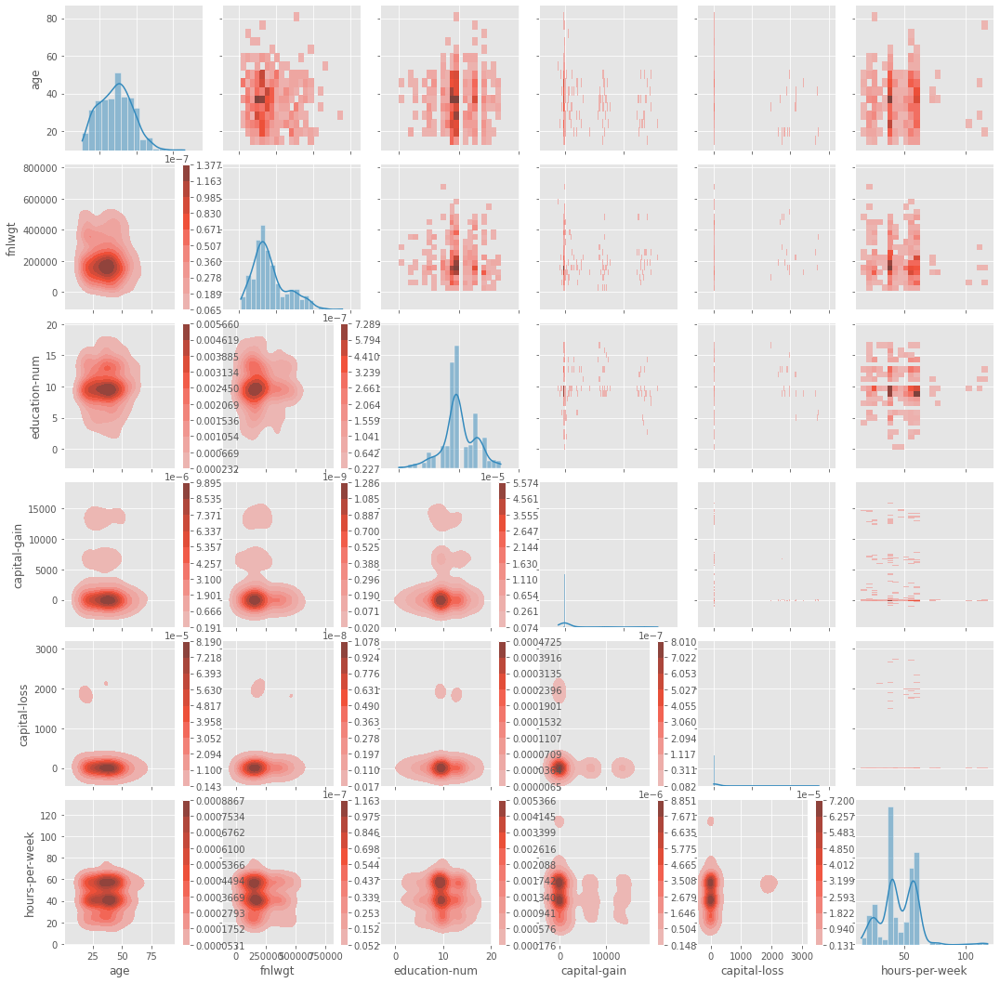

In [ ]:
g = sns.PairGrid(unknown_entries)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot, fill=True, cbar=True)
g.map_diag(sns.histplot, kde=True, cbar=True)

QQ plot




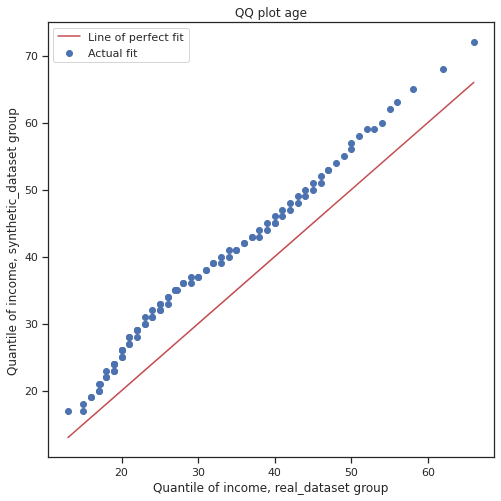

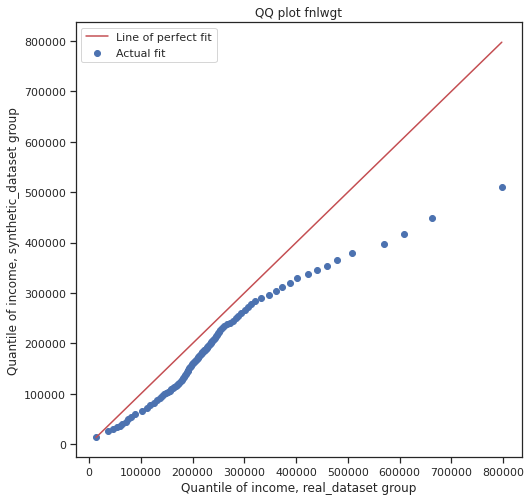

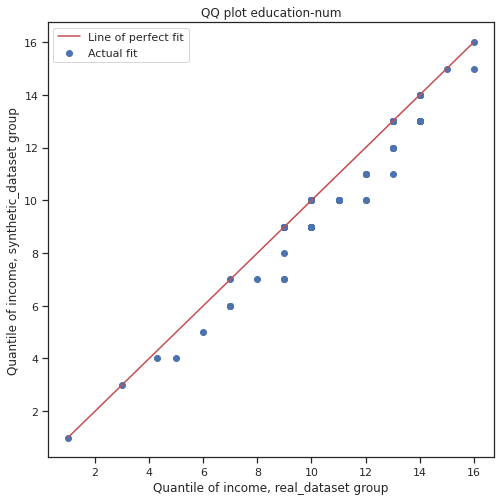

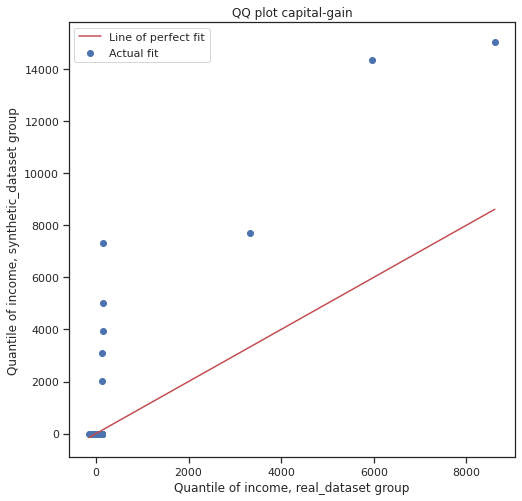

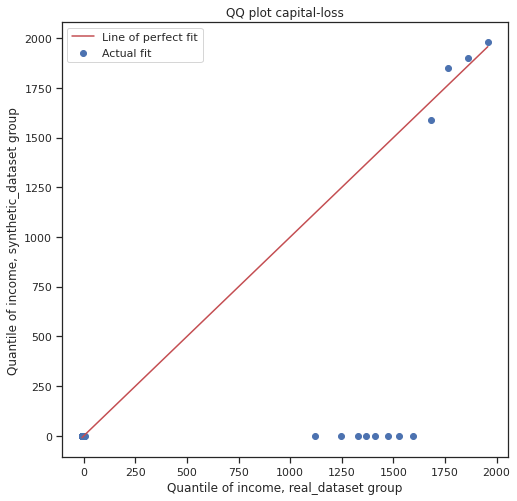

...

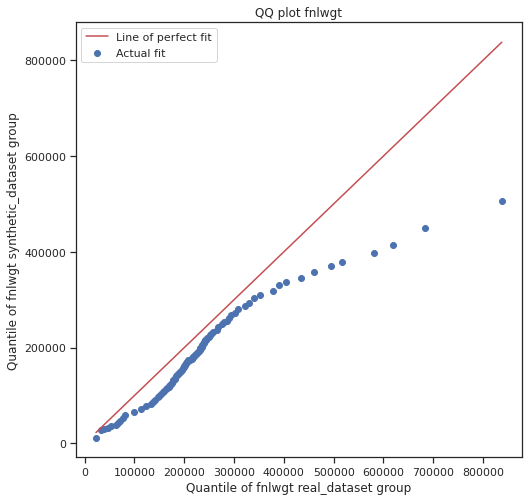

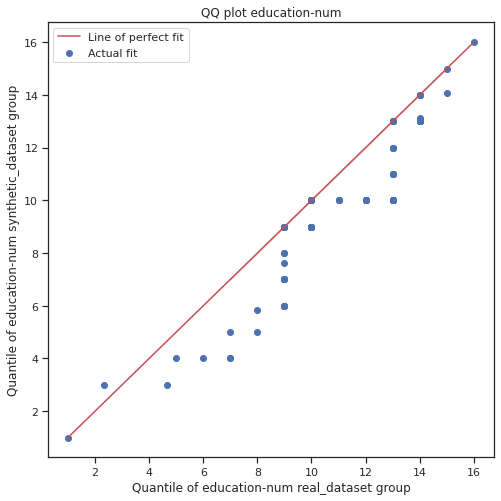

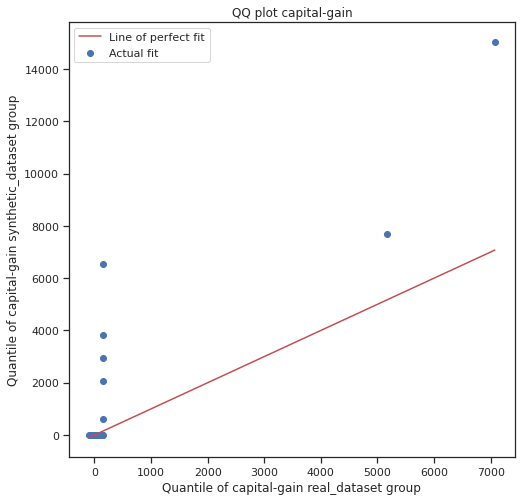

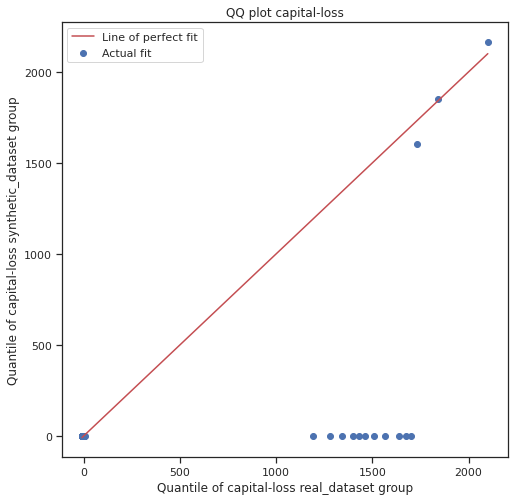

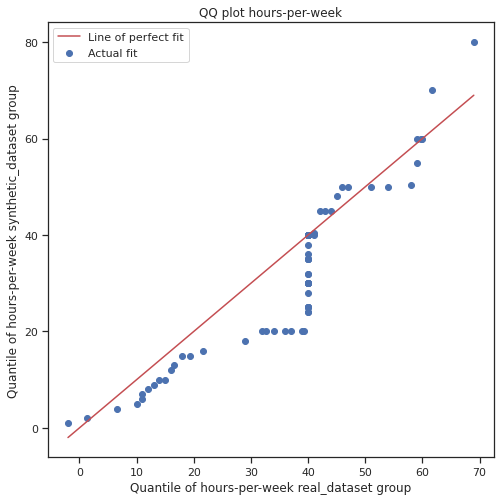

In [ ]:
print('QQ plot')
# If the distributions are the same, we should get a 45-degree line.
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
sns.set(style='ticks',color_codes=True)


# known_entries
for col in non_discrete_columns:
    income = real_data[col].values
    income_t = real_dataset['known_entries'][col].values
    income_c = synthetic_dataset['known_entries'][col].values

    df_pct = pd.DataFrame()
    df_pct['q_treatment'] = np.percentile(income_t, range(100))
    df_pct['q_control'] = np.percentile(income_c, range(100))

    plt.figure(figsize=(8, 8))
    plt.scatter(x='q_control', y='q_treatment', data=df_pct, label='Actual fit');
    sns.lineplot(x='q_control', y='q_control', data=df_pct, color='r', label='Line of perfect fit');
    plt.xlabel('Quantile of income, real_dataset group')
    plt.ylabel('Quantile of income, synthetic_dataset group')
    plt.legend()
    plt.title("QQ plot " + col);

print('\n')
# unknown_entries
for col in non_discrete_columns:
    income = real_data[col].values
    income_t = real_dataset['unknown_entries'][col].values
    income_c = synthetic_dataset['unknown_entries'][col].values

    df_pct = pd.DataFrame()
    df_pct['q_treatment'] = np.percentile(income_t, range(100))
    df_pct['q_control'] = np.percentile(income_c, range(100))

    plt.figure(figsize=(8, 8))
    plt.scatter(x='q_control', y='q_treatment', data=df_pct, label='Actual fit');
    sns.lineplot(x='q_control', y='q_control', data=df_pct, color='r', label='Line of perfect fit');
    plt.xlabel('Quantile of ' + col + ' real_dataset group')
    plt.ylabel('Quantile of ' + col + ' synthetic_dataset group')
    plt.legend()
    plt.title("QQ plot " + col);

In [ ]:
# TO DELETE THIS PART
# !pip install joypy
# from joypy import joyplot
# %matplotlib inline

# fig, axes = joyplot(synthetic_dataset['known_entries'], by="sex") #, by='Arm', column='income', colormap=sns.color_palette("crest", as_cmap=True));
# plt.xlabel('Income');
# # plt.title("Ridgeline Plot, multiple groups");

In [ ]:
print('Welch’s t-test') # improved Student T-test
from scipy.stats import ttest_ind
# real_dataset['known_entries'], synthetic_dataset['known_entries']
for col in non_discrete_columns:
    stat, p_value = ttest_ind(real_dataset['known_entries'][col], synthetic_dataset['known_entries'][col], equal_var=False) 
    print(col, f"t-test: statistic={stat:.4f}, p-value={p_value:.4f}")

print('\n')
# real_dataset['unknown_entries'], synthetic_dataset['unknown_entries']
for col in non_discrete_columns:
    stat, p_value = ttest_ind(real_dataset['unknown_entries'][col], synthetic_dataset['unknown_entries'][col], equal_var=False)
    print(col, f"t-test: statistic={stat:.4f}, p-value={p_value:.4f}")

Welch’s t-test
age t-test: statistic=4.8557, p-value=0.0000
fnlwgt t-test: statistic=19.0426, p-value=0.0000
education-num t-test: statistic=9.0836, p-value=0.0000
capital-gain t-test: statistic=1.7431, p-value=0.0814
capital-loss t-test: statistic=12.5401, p-value=0.0000
hours-per-week t-test: statistic=-4.3456, p-value=0.0000


age t-test: statistic=3.1215, p-value=0.0019
fnlwgt t-test: statistic=4.3799, p-value=0.0000
education-num t-test: statistic=-0.2716, p-value=0.7860
capital-gain t-test: statistic=0.3711, p-value=0.7106
capital-loss t-test: statistic=2.2228, p-value=0.0265
hours-per-week t-test: statistic=-11.4182, p-value=0.0000


In [ ]:
print('Mann–Whitney U Test') # Usually, a value below 0.1 is considered a “small” difference.
from scipy.stats import mannwhitneyu
# real_dataset['known_entries'], synthetic_dataset['known_entries']
for col in non_discrete_columns:
    stat, p_value = mannwhitneyu(real_dataset['known_entries'][col], synthetic_dataset['known_entries'][col])
    print(col, f" Mann–Whitney U Test: statistic={stat:.4f}, p-value={p_value:.4f}")

print('\n')
# real_dataset['unknown_entries'], synthetic_dataset['unknown_entries']
for col in non_discrete_columns:
    stat, p_value = mannwhitneyu(real_dataset['unknown_entries'][col], synthetic_dataset['unknown_entries'][col])
    print(col, f" Mann–Whitney U Test: statistic={stat:.4f}, p-value={p_value:.4f}")

Mann–Whitney U Test
age  Mann–Whitney U Test: statistic=43542402.5000, p-value=0.0000
fnlwgt  Mann–Whitney U Test: statistic=49459357.0000, p-value=0.0000
education-num  Mann–Whitney U Test: statistic=47439256.5000, p-value=0.0000
capital-gain  Mann–Whitney U Test: statistic=53938026.5000, p-value=0.0000
capital-loss  Mann–Whitney U Test: statistic=12606134.0000, p-value=0.0000
hours-per-week  Mann–Whitney U Test: statistic=41856322.5000, p-value=0.4936


age  Mann–Whitney U Test: statistic=537539.5000, p-value=0.8130
fnlwgt  Mann–Whitney U Test: statistic=599480.0000, p-value=0.0000
education-num  Mann–Whitney U Test: statistic=559728.5000, p-value=0.0952
capital-gain  Mann–Whitney U Test: statistic=681729.5000, p-value=0.0000
capital-loss  Mann–Whitney U Test: statistic=123532.0000, p-value=0.0000
hours-per-week  Mann–Whitney U Test: statistic=371695.5000, p-value=0.0000


In [ ]:
print('Brunner-Munzel test')
from scipy.stats import brunnermunzel
# real_dataset['known_entries'], synthetic_dataset['known_entries']
for col in non_discrete_columns:
    stat, p_value = brunnermunzel(real_dataset['known_entries'][col], synthetic_dataset['known_entries'][col])
    print(col, f" Brunner-Munzel Test: statistic={stat:.4f}, p-value={p_value:.4f}")

print('\n')
# real_dataset['unknown_entries'], synthetic_dataset['unknown_entries']
for col in non_discrete_columns:
    stat, p_value = brunnermunzel(real_dataset['unknown_entries'][col], synthetic_dataset['unknown_entries'][col])
    print(col, f" Brunner-Munzel Test: statistic={stat:.4f}, p-value={p_value:.4f}")

Brunner-Munzel test
age  Brunner-Munzel Test: statistic=-4.2546, p-value=0.0000
fnlwgt  Brunner-Munzel Test: statistic=-15.9603, p-value=0.0000
education-num  Brunner-Munzel Test: statistic=-13.2747, p-value=0.0000
capital-gain  Brunner-Munzel Test: statistic=-17.3653, p-value=0.0000
capital-loss  Brunner-Munzel Test: statistic=64.0513, p-value=0.0000
hours-per-week  Brunner-Munzel Test: statistic=-0.6773, p-value=0.4982


age  Brunner-Munzel Test: statistic=-0.2882, p-value=0.7732
fnlwgt  Brunner-Munzel Test: statistic=-3.9084, p-value=0.0001
education-num  Brunner-Munzel Test: statistic=-1.8082, p-value=0.0710
capital-gain  Brunner-Munzel Test: statistic=-6.3618, p-value=0.0000
capital-loss  Brunner-Munzel Test: statistic=30.9985, p-value=0.0000
hours-per-week  Brunner-Munzel Test: statistic=12.2238, p-value=0.0000


In [ ]:
### TODO: rename control and treatment
print('Chi-Squared Test')
import pandas as pd
from scipy.stats import chisquare

# real_dataset['known_entries'], synthetic_dataset['known_entries']
for col in non_discrete_columns:
    control = real_dataset['known_entries'][col]
    treatment = synthetic_dataset['known_entries'][col]
    # Init dataframe
    df_bins = pd.DataFrame()
    # Generate bins from control group
    _, bins = pd.qcut(control, q=10, retbins=True, duplicates='drop')
    df_bins['bin'] = pd.cut(control, bins=bins).value_counts().index
    # Apply bins to both groups
    df_bins['control_observed'] = pd.cut(control, bins=bins).value_counts().values
    df_bins['treatment_observed'] = pd.cut(treatment, bins=bins).value_counts().values
    # Compute expected frequency in the treatment group
    df_bins['treatment_expected'] = df_bins['control_observed'] / np.sum(df_bins['control_observed']) * np.sum(df_bins['treatment_observed'])
    print(df_bins)

    stat, p_value = chisquare(df_bins['treatment_observed'], df_bins['treatment_expected'])
    print(col, f"Chi-squared Test: statistic={stat:.4f}, p-value={p_value:.4f}")

print('\n')
# real_dataset['unknown_entries'], synthetic_dataset['unknown_entries']
for col in non_discrete_columns:
    control = real_dataset['unknown_entries'][col]
    treatment = synthetic_dataset['unknown_entries'][col]
    # Init dataframe
    df_bins = pd.DataFrame()
    # Generate bins from control group
    _, bins = pd.qcut(control, q=10, retbins=True, duplicates='drop')
    df_bins['bin'] = pd.cut(control, bins=bins).value_counts().index
    # Apply bins to both groups
    df_bins['control_observed'] = pd.cut(control, bins=bins).value_counts().values
    df_bins['treatment_observed'] = pd.cut(treatment, bins=bins).value_counts().values
    # Compute expected frequency in the treatment group
    df_bins['treatment_expected'] = df_bins['control_observed'] / np.sum(df_bins['control_observed']) * np.sum(df_bins['treatment_observed'])
    print(df_bins)

    stat, p_value = chisquare(df_bins['treatment_observed'], df_bins['treatment_expected'])
    print(col, f"Chi-squared Test: statistic={stat:.4f}, p-value={p_value:.4f}")

Chi-Squared Test
            bin  control_observed  treatment_observed  treatment_expected
0  (33.0, 37.0]              3344                 338          293.443454
1  (26.0, 30.0]              3184                 325          279.403097
2  (22.0, 26.0]              3120                 299          273.786954
3  (37.0, 41.0]              3111                 281          272.997184
4  (45.0, 50.0]              3047                 268          267.381042
5  (17.0, 22.0]              2965                 261          260.185359
6  (50.0, 57.0]              2934                 227          257.465040
7  (41.0, 45.0]              2894                 220          253.954951
8  (57.0, 90.0]              2758                 206          242.020648
9  (30.0, 33.0]              2477                 193          217.362271
age Chi-squared Test: statistic=33.0035, p-value=0.0001
                     bin  control_observed  treatment_observed  \
0  (329002.6, 1484705.0]              3017     

In [ ]:
### TODO
print('Kolmogorov-Smirnov Test')


In [ ]:
### TODO: check the KL divergence v.s. permutation
print('KL Divergence')
from scipy.special import kl_div
from scipy.special import rel_entr
import numpy as np
non_discrete_columns = [ col for col in real_data.columns if col not in discrete_columns]

# real_dataset['known_entries'], synthetic_dataset['known_entries']
sample_size = min(len(real_dataset['known_entries']), len(synthetic_dataset['known_entries']))
for col in non_discrete_columns:
    sample_stat = np.mean(real_dataset['known_entries'][col]) - np.mean(synthetic_dataset['known_entries'][col])
    stats = np.zeros(1000)
    kl_stat = []
    for k in range(1000):
        perm1 = real_dataset['known_entries'][col].sample(n=sample_size, random_state=k, replace=False)
        perm2 = synthetic_dataset['known_entries'][col].sample(n=sample_size, random_state=k, replace=False)

        stats[k] = np.mean(perm1) - np.mean(perm2)
        kl_stat.append(sum(rel_entr(perm1.values, perm2.values)))

    kl_stats = np.mean(kl_stat)

    p_value = np.mean(stats > sample_stat)
    print(col, f"Permutation test: p-value={p_value:.4f}, KL Divergence: statistic={kl_stats:.4f}")


print('\n')
# real_dataset['unknown_entries'], synthetic_dataset['unknown_entries']
sample_size = min(len(real_dataset['unknown_entries']), len(synthetic_dataset['unknown_entries']))
for col in non_discrete_columns:
    sample_stat = np.mean(real_dataset['unknown_entries'][col]) - np.mean(synthetic_dataset['unknown_entries'][col])
    stats = np.zeros(1000)
    kl_stat = []
    for k in range(1000):
        perm1 = real_dataset['unknown_entries'][col].sample(n=sample_size, random_state=k, replace=False)
        perm2 = synthetic_dataset['unknown_entries'][col].sample(n=sample_size, random_state=k, replace=False)

        stats[k] = np.mean(perm1) - np.mean(perm2)
        kl_stat.append(sum(rel_entr(perm1.values, perm2.values)))

    kl_stats = np.mean(kl_stat)

    p_value = np.mean(stats > sample_stat)
    print(col, f"Permutation test: p-value={p_value:.4f}, KL Divergence: statistic={kl_stats:.4f}")


KL Divergence
age Permutation test: p-value=0.4990, KL Divergence: statistic=31132.3229
fnlwgt Permutation test: p-value=0.5100, KL Divergence: statistic=31446704.9481
education-num Permutation test: p-value=0.4820, KL Divergence: statistic=528.2770
capital-gain Permutation test: p-value=0.4930, KL Divergence: statistic=inf
capital-loss Permutation test: p-value=0.4500, KL Divergence: statistic=inf
hours-per-week Permutation test: p-value=0.5140, KL Divergence: statistic=inf


age Permutation test: p-value=0.5050, KL Divergence: statistic=9242.8997
fnlwgt Permutation test: p-value=0.4860, KL Divergence: statistic=7331426.1915
education-num Permutation test: p-value=0.5060, KL Divergence: statistic=-133.9731
capital-gain Permutation test: p-value=0.4630, KL Divergence: statistic=inf
capital-loss Permutation test: p-value=0.5050, KL Divergence: statistic=inf
hours-per-week Permutation test: p-value=0.5030, KL Divergence: statistic=inf


In [ ]:
### TODO: split into control and treatment
### https://towardsdatascience.com/how-to-compare-two-or-more-distributions-9b06ee4d30bf

# print('Permutation Tests')
# import numpy as np
# # real_dataset['known_entries'], synthetic_dataset['known_entries']
# for col in non_discrete_columns:
#     sample_stat = np.mean(real_dataset['known_entries'][col]) - np.mean(synthetic_dataset['known_entries'][col])
#     stats = np.zeros(1000)
#     for k in range(1000):
#         perm1 = np.random.permutation(real_dataset['known_entries'][col])
#         perm2 = np.random.permutation(synthetic_dataset['known_entries'][col])

#         stats[k] = np.mean(perm1) - np.mean(perm2)
#     p_value = np.mean(stats > sample_stat)

#     print(col, f"Permutation test: p-value={p_value:.4f}")

# # print(real_dataset['known_entries'][col])
# # print(np.random.permutation(real_dataset['known_entries'][col]))

# # print((real_dataset['known_entries'][col]==40).values)
# # print(np.random.permutation((real_dataset['known_entries'][col]==40).values))


percentage dataset: 0.1 random_state: 1

Classifier F1-scores and their Jaccard similarities::
                             f1_real  f1_fake  jaccard_similarity
index                                                            
DecisionTreeClassifier_fake   0.6203   0.5797              0.4254
DecisionTreeClassifier_real   0.8234   0.5672              0.3793
LogisticRegression_fake       0.6656   0.7234              0.7321
LogisticRegression_real       0.7859   0.7609              0.7927
MLPClassifier_fake            0.6953   0.7047              0.9512
MLPClassifier_real            0.7750   0.7609              0.9542
RandomForestClassifier_fake   0.7000   0.6969              0.8130
RandomForestClassifier_real   0.8578   0.7453              0.6537

Privacy results:
                                         result
Duplicate rows between sets (real/fake)  (0, 0)
nearest neighbor mean                    2.9079
nearest neighbor std                     0.4320

Miscellaneous results:
           

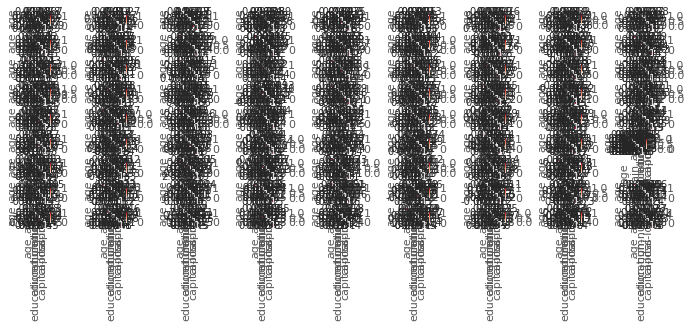

In [ ]:
#getting average
# random sampling 
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
%matplotlib inline
import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')

plt.figure(figsize=(100,4))

for percentage in (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9):
    for random_state in range(1, 10):
        print('percentage dataset:', percentage, 'random_state:', random_state)
        
        percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

        # Initiates the CTGANSynthesizer and call its fit method to pass in the table
        ctgan = CTGANSynthesizer(epochs=epochs)
        ctgan.fit(percent_data, discrete_columns)
        percent_synthetic_data = ctgan.sample(num_samples)

        plt.subplot(9,9,int(percentage*90-9+random_state))
        sns.heatmap(percent_synthetic_data.corr(), cmap='coolwarm', center=0,
                      square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True) 

        table_evaluator = TableEvaluator(real_data, percent_synthetic_data, cat_cols=discrete_columns) 

        # table_evaluator.visual_evaluation()
        table_evaluator.evaluate(target_col=cols) 
plt.show()

percentage dataset: 0.1 random_state: 1
percentage dataset: 0.1 random_state: 2
percentage dataset: 0.1 random_state: 3
percentage dataset: 0.1 random_state: 4
percentage dataset: 0.1 random_state: 5
percentage dataset: 0.1 random_state: 6
percentage dataset: 0.1 random_state: 7
percentage dataset: 0.1 random_state: 8
percentage dataset: 0.1 random_state: 9
percentage dataset: 0.2 random_state: 1
percentage dataset: 0.2 random_state: 2
percentage dataset: 0.2 random_state: 3
percentage dataset: 0.2 random_state: 4
percentage dataset: 0.2 random_state: 5
percentage dataset: 0.2 random_state: 6
percentage dataset: 0.2 random_state: 7
percentage dataset: 0.2 random_state: 8
percentage dataset: 0.2 random_state: 9
percentage dataset: 0.3 random_state: 1
percentage dataset: 0.3 random_state: 2
percentage dataset: 0.3 random_state: 3
percentage dataset: 0.3 random_state: 4
percentage dataset: 0.3 random_state: 5
percentage dataset: 0.3 random_state: 6
percentage dataset: 0.3 random_state: 7


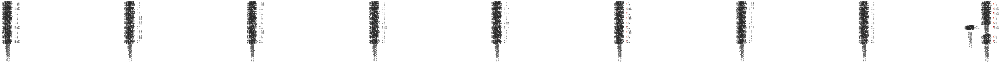

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
%matplotlib inline
import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')

plt.figure(figsize=(100,4))

for percentage in (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9):
    for random_state in range(1, 10):
        print('percentage dataset:', percentage, 'random_state:', random_state)
        
        percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

        # Initiates the CTGANSynthesizer and call its fit method to pass in the table
        ctgan = CTGANSynthesizer(epochs=epochs)
        ctgan.fit(percent_data, discrete_columns)
        percent_synthetic_data = ctgan.sample(num_samples)

        plt.subplot(9,9,int(percentage*90-9+random_state))
        sns.heatmap(percent_synthetic_data.corr(), cmap='coolwarm', center=0,
                      square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True) 

        # table_evaluator = TableEvaluator(real_data, percent_synthetic_data, cat_cols=discrete_columns) 

        # table_evaluator.visual_evaluation()
        # table_evaluator.evaluate(target_col=cols) 
plt.show()

In [ ]:
# random sampling 
import numpy as np
percentage = 0.1
random_state = 1
ten_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(ten_percent_data.shape)

# random sampling 
percentage = 0.2
twenty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(twenty_percent_data.shape)

# random sampling 
percentage = 0.3
thirty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(thirty_percent_data.shape)

# random sampling 
percentage = 0.4
fourty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(fourty_percent_data.shape)

# random sampling 
percentage = 0.5
fifty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(fifty_percent_data.shape)

# random sampling 
percentage = 0.6
sixty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(sixty_percent_data.shape)

# random sampling 
percentage = 0.7
seventy_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(seventy_percent_data.shape)

# random sampling 
percentage = 0.8
eighty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(eighty_percent_data.shape)

# random sampling 
percentage = 0.9
ninety_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)
print(ninety_percent_data.shape)


# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(ten_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
ten_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(twenty_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
twenty_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(thirty_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
thirty_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(fourty_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
fourty_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(fifty_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
fifty_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(sixty_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
sixty_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(seventy_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
seventy_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(eighty_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
eighty_percent_synthetic_data = ctgan.sample(num_samples)

# Initiates the CTGANSynthesizer and call its fit method to pass in the table
ctgan = CTGANSynthesizer(epochs=epochs)
ctgan.fit(ninety_percent_data, discrete_columns)
#generate synthetic data, 1000 rows of data
ninety_percent_synthetic_data = ctgan.sample(num_samples)

print(ten_percent_synthetic_data.head(1))
print(twenty_percent_synthetic_data.head(1))
print(thirty_percent_synthetic_data.head(1))
print(fourty_percent_synthetic_data.head(1))
print(fifty_percent_synthetic_data.head(1))
print(sixty_percent_synthetic_data.head(1))
print(seventy_percent_synthetic_data.head(1))
print(eighty_percent_synthetic_data.head(1))
print(ninety_percent_synthetic_data.head(1))

(3256, 15)
(6512, 15)
(9768, 15)
(13024, 15)
(16280, 15)
(19537, 15)
(22793, 15)
(26049, 15)
(29305, 15)


In [ ]:
cols = 'income'
mapping = {'10': ten_percent_synthetic_data,
           '20': twenty_percent_synthetic_data,
           '30': thirty_percent_synthetic_data,
           '40': fourty_percent_synthetic_data,
           '50': fifty_percent_synthetic_data,
           '60': sixty_percent_synthetic_data,
           '70': seventy_percent_synthetic_data,
           '80': eighty_percent_synthetic_data,
           '90': ninety_percent_synthetic_data,
           }
for percentage_synthetic_data in (['10','20','30','40','50','60','70','80','90']):
    table_evaluator = TableEvaluator(real_data, mapping[percentage_synthetic_data], cat_cols=discrete_columns) 
    print('percentage dataset:', percentage_synthetic_data)
    table_evaluator.visual_evaluation()
    table_evaluator.evaluate(target_col=cols) 

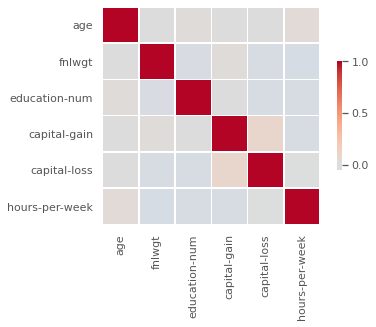

In [ ]:
# table_evaluator.evaluate(target_col=cols)

In [ ]:
#getting average
# random sampling 
for random_state in range(2, 10):
    percentage = 0.1
    ten_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.2
    twenty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.3
    thirty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.4
    fourty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.5
    fifty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.6
    sixty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.7
    seventy_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.8
    eighty_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

    # random sampling 
    percentage = 0.9
    ninety_percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(ten_percent_data, discrete_columns)
    ten_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(twenty_percent_data, discrete_columns)
    twenty_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(thirty_percent_data, discrete_columns)
    thirty_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(fourty_percent_data, discrete_columns)
    fourty_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(fifty_percent_data, discrete_columns)
    fifty_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(sixty_percent_data, discrete_columns)
    sixty_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(seventy_percent_data, discrete_columns)
    seventy_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(eighty_percent_data, discrete_columns)
    eighty_percent_synthetic_data = ctgan.sample(num_samples)


    # Initiates the CTGANSynthesizer and call its fit method to pass in the table
    ctgan = CTGANSynthesizer(epochs=epochs)
    ctgan.fit(ninety_percent_data, discrete_columns)
    ninety_percent_synthetic_data = ctgan.sample(num_samples)


    mapping = {'10': ten_percent_synthetic_data,
              '20': twenty_percent_synthetic_data,
              '30': thirty_percent_synthetic_data,
              '40': fourty_percent_synthetic_data,
              '50': fifty_percent_synthetic_data,
              '60': sixty_percent_synthetic_data,
              '70': seventy_percent_synthetic_data,
              '80': eighty_percent_synthetic_data,
              '90': ninety_percent_synthetic_data,
              }
    for percentage_synthetic_data in (['10','20','30','40','50','60','70','80','90']):
        table_evaluator = TableEvaluator(real_data, mapping[percentage_synthetic_data], cat_cols=discrete_columns) 
        print('percentage dataset:', percentage_synthetic_data)
        # table_evaluator.visual_evaluation()
        table_evaluator.evaluate(target_col=cols) 

percentage dataset: 0.1 random_state: 1

Classifier F1-scores and their Jaccard similarities::
                             f1_real  f1_fake  jaccard_similarity
index                                                            
DecisionTreeClassifier_fake   0.6800   0.6500              0.4388
DecisionTreeClassifier_real   0.7700   0.6700              0.4599
LogisticRegression_fake       0.7200   0.8000              0.8349
LogisticRegression_real       0.7850   0.7400              0.7937
MLPClassifier_fake            0.7600   0.7750              0.9512
MLPClassifier_real            0.7500   0.7500              0.9608
RandomForestClassifier_fake   0.7600   0.7600              0.8018
RandomForestClassifier_real   0.8050   0.7150              0.6807

Privacy results:
                                         result
Duplicate rows between sets (real/fake)  (0, 0)
nearest neighbor mean                    2.5366
nearest neighbor std                     0.5694

Miscellaneous results:
           

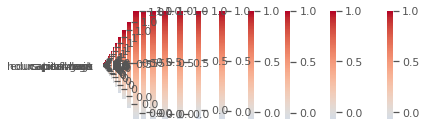

In [ ]:
#getting average
# random sampling 
import warnings
warnings.filterwarnings("ignore")
for percentage in (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9):
    for random_state in range(1, 10):
        print('percentage dataset:', percentage, 'random_state:', random_state)
        
        percent_data = real_data.sample(frac = percentage, random_state=random_state, replace=False)

        # Initiates the CTGANSynthesizer and call its fit method to pass in the table
        ctgan = CTGANSynthesizer(epochs=epochs)
        ctgan.fit(percent_data, discrete_columns)
        percent_synthetic_data = ctgan.sample(num_samples)
        sns.heatmap(percent_synthetic_data.corr(), cmap='coolwarm', center=0,
              square=True, linewidths=.5, cbar_kws={"shrink": .5})

        table_evaluator = TableEvaluator(real_data, percent_synthetic_data, cat_cols=discrete_columns) 

        # table_evaluator.visual_evaluation()
        table_evaluator.evaluate(target_col=cols) 